# PERFORMING EDA ON ENERGY DATASETS

## IMPORTING MODULES REQUIRED 

In [56]:
import csv
import seaborn as sns
import matplotlib.pyplot as plt
import pandas as pd
import numpy as np
import urllib
from urllib import request
import pandas_profiling
from statistics import mean 
import plotly.plotly as py
from plotly.graph_objs import *
import plotly.plotly as py
import plotly.graph_objs as go
import missingno as msno

## IMPORTING THE DATASET

In [57]:
url = "https://raw.githubusercontent.com/LuisM78/Appliances-energy-prediction-data/master/energydata_complete.csv"
df = pd.read_csv(url)
#df.head(2)

## MAKING NEW COLUMNS FROM EXISTING ONE 

In [58]:
df['date'] = pd.to_datetime(df['date'])
df['month'] , df['time'] , df['hour'] ,df['day'] , df['day_of_week'],df['Numerical_Week'] =  df['date'].dt.month , df['date'].dt.time , df['date'].dt.hour , df['date'].dt.day , df['date'].dt.weekday_name,df['date'].dt.weekday
df['weekStatus'] = df['date'].dt.dayofweek
df['WeekStatus'] = np.where(df['weekStatus'] < 5, 'Weekday', 'Weekend')

# converting the time to seconds , appending that column to the existing dataframe and then making the 'date' column as index to 
# the dataset.
d = df.date[0:len(df.date)]
data = []
#print(data)
for i in range (len(d)):
    if (i==0):
        a = 61200
        data.append(a)
    elif (i > 0 ):
        a = a + 600
        data.append(a)
#print((data))
df1 = pd.DataFrame({'data_converted' : data})
df['NSM'] = df1
#df
#d_1 = pd.DataFrame(np.array(data).reshape(-1,1))#, columns = list("abc"))
#df['date_converted'] = d_1
#df.columns
#df = df.set_index('date')
#df

## CONVERTING INT FORMAT OF MONTH TO STRING FOR CLASSIFICATION BASED ON MONTH

In [59]:
import calendar
df['month'] = df['month'].apply(lambda x: calendar.month_abbr[x])

first_month = df.loc[df['month'] == 'Jan']
second_month = df.loc[df['month'] == 'Feb']
third_month = df.loc[df['month'] == 'Mar']
forth_month = df.loc[df['month'] == 'Apr']
fifth_month = df.loc[df['month'] == 'May']

## OVERVIEW OF THE DATA 

In [54]:
pandas_profiling.ProfileReport(df)

Number of variables,38
Number of observations,19735
Total Missing (%),0.0%
Total size in memory,5.7 MiB
Average record size in memory,304.0 B
Numeric,29
Categorical,4
Boolean,0
Date,1
Text (Unique),0
Rejected,4


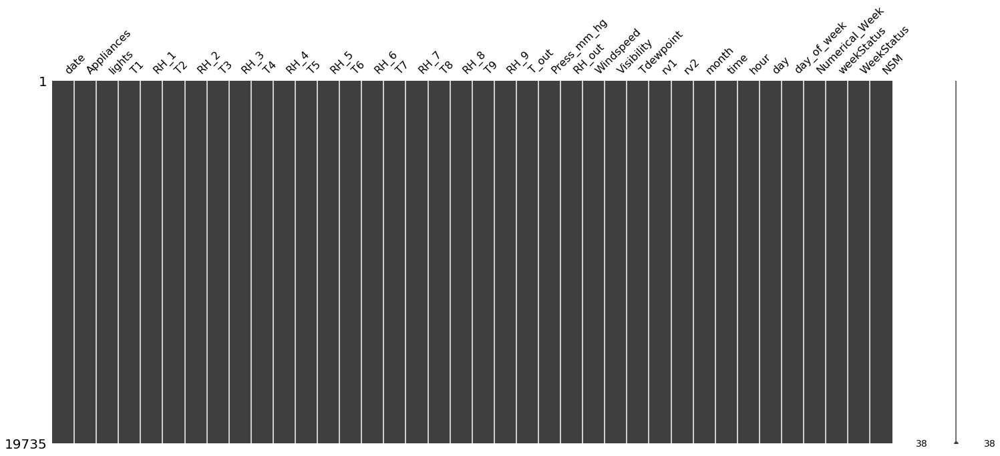

In [7]:
%matplotlib inline
msno.matrix(df)

In [55]:
df.shape

(19735, 38)

## THERE ARE 38 VARIABLES IN TOTAL OUT OF WHICH WE WILL BE ANALYSING 35 VARABLES( after omiting date , rv1 , rv2)

### 1.OVERALL DATA ANALYSIS

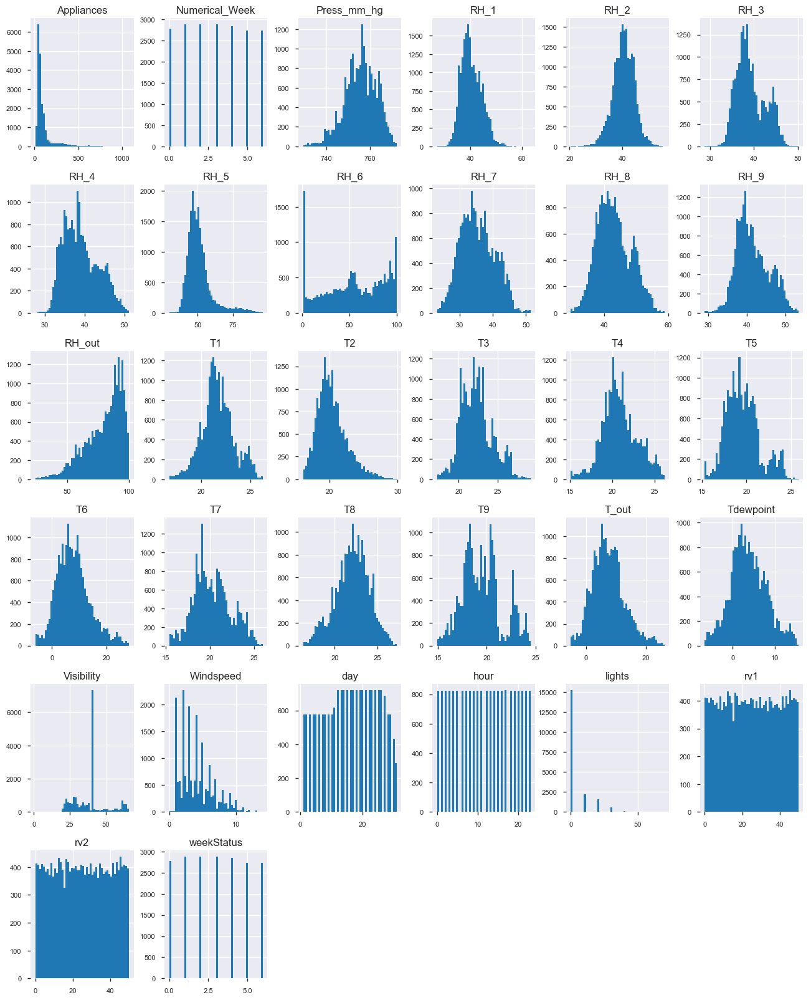

In [7]:
#helps us in analysing which observation was recorded the most for each variable.

df.hist(figsize=(16, 20), bins=50, xlabelsize=8, ylabelsize=8)
plt.show()

### 2.ANALYSING APPLIANCES 

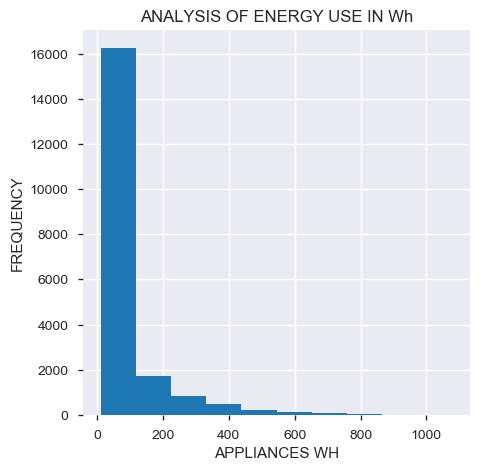

In [11]:
#using histogram - finding the occurance of each observation

plt.figure(figsize=(5, 5))
plt.hist(df['Appliances'])
plt.xlabel('APPLIANCES WH')
plt.ylabel('FREQUENCY')
plt.title('ANALYSIS OF ENERGY USE IN Wh')
plt.show()

#### Detecting Outliers

In [60]:
trace0 = go.Box(x=df.Appliances)

data = [trace0]
py.iplot(data)

### Maximum usage of appliances is in the range of 0 to 200 Wh

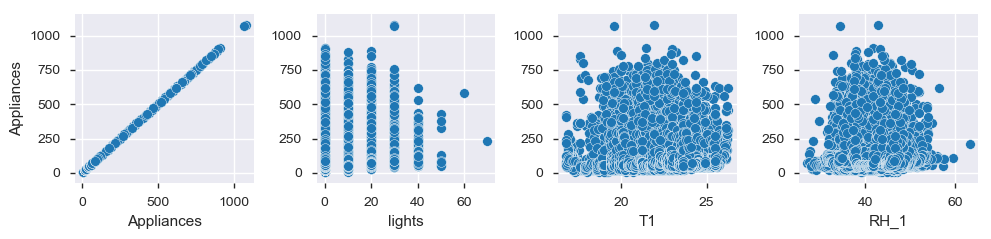

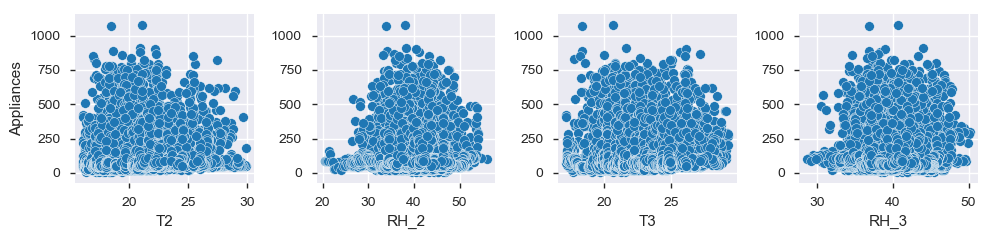

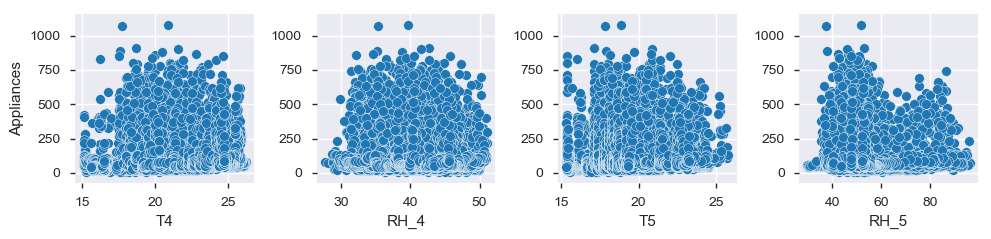

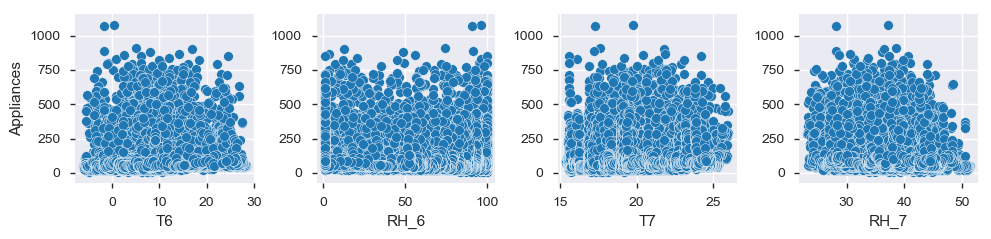

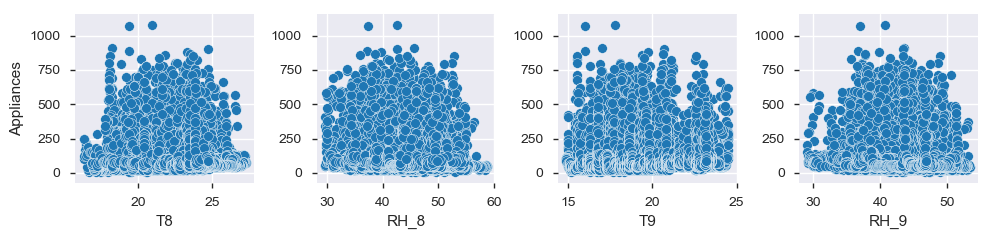

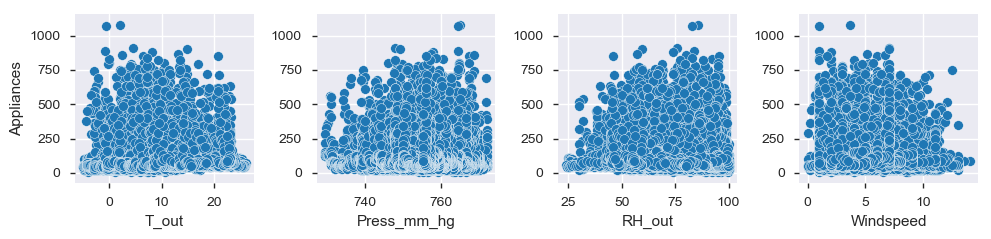

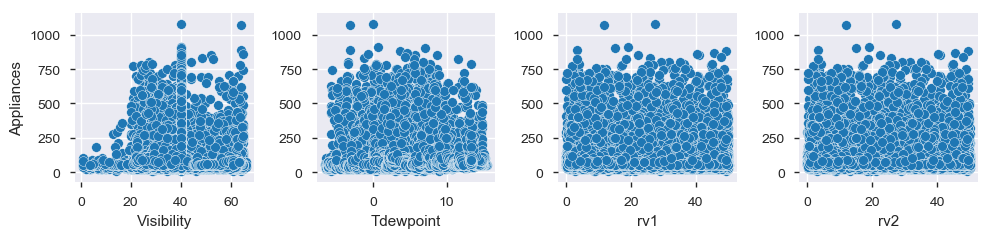

In [15]:
# Analysing appliances with other variables to ckeck if we get any direct relationship

for i in range(0, len(df.columns)-10 , 4):
    sns.pairplot(data=df,
                x_vars=df.columns[i+1:i+5],
                y_vars=['Appliances'])
plt.show()

### *From the above graphs that is plotted , no concrete conclusions can be made.* 

### TO ANALYSE APPLIANCES IN DETAIL , LET'S ANALYSE IT WITH RESPECT TO MONTH AND TIME

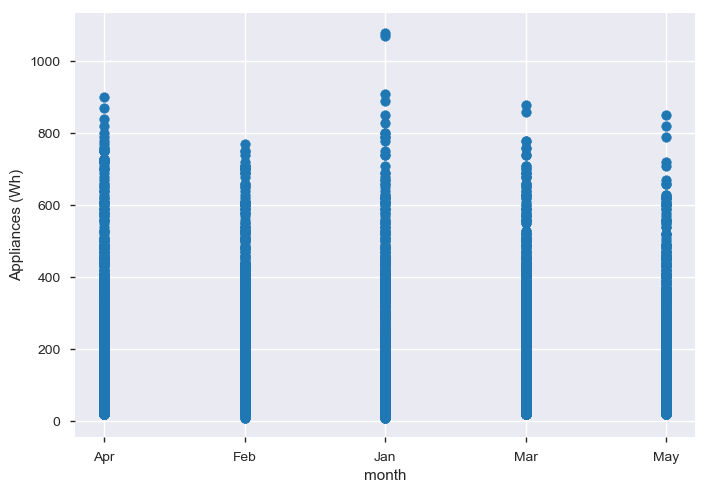

In [16]:
#analysing with respect to month

# maximum appliances usage

#plt.title('USAGE')
plt.scatter(df['month'] , df['Appliances'])
plt.xlabel('month')
plt.ylabel('Appliances (Wh)')
plt.show()

#### *From the graph that is plotted above , we can observe that Jan has highest energy usage which is around 1000W. * 

#### IF WE ELIMINATE THAT POINT FROM THE GRAPH , THE MAXIMUM IS USED BY APRIL , MARCH AND THE LEAST BY THE MONTH OF FEBRUARY

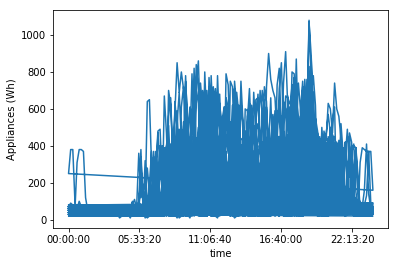

In [17]:
#analysing with respect to time 

plt.plot(df['time'] , df['Appliances'])
plt.xlabel('time')
plt.ylabel('Appliances (Wh)')
plt.show()
#plt.savefig()

### *There is  a hike in the plot around 12pm and again the hike is around 19:00 to 19:30 pm , but again nothing can be concluded from this. We need to analyse it further*

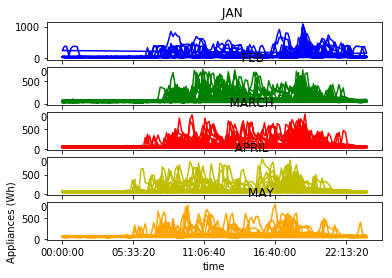

In [65]:
#analysing consumption of energy every month with respect to time

plt.figure(figsize=(1,1))
fig, axarr = plt.subplots(5, 1 )
axarr[0].plot(first_month['time'] , first_month['Appliances'] ,color ='b')# , axarr[0,0])
axarr[0].set_title('         JAN')
axarr[1].plot(second_month['time'] ,second_month['Appliances'] ,color ='g')
axarr[1].set_title('                    FEB')
axarr[2].plot(third_month['time'] , third_month['Appliances'] ,color ='r')
axarr[2].set_title('                   MARCH')
axarr[3].plot(forth_month['time'] , forth_month['Appliances'] ,color ='y')
axarr[3].set_title('                   APRIL')
axarr[4].plot(fifth_month['time'] , fifth_month['Appliances'] ,color ='Orange')
axarr[4].set_title('                        MAY')
#plt.tight_layout #(pad=0.4), w_pad=0.5) , h_pad=10.0)
plt.xlabel('time')
plt.ylabel('Appliances (Wh)')
plt.show()
#plt.savefig('each month time appliances.png')

#### *1.From the above plot , we can conclude that there is a maximum usage of appliances in Wh between 19:00 pm to 19:30 pm expect in the month of April and May.* 
#### *2.One more conclusion that we can make is that , except  in the month of Jan , all the other months have low energy usage between 00:00:00 to 5:30 am.* 

In [66]:
# Analysing why there is a hike in the Appliances usage between 12 midnight to 5:30 am in the month of Jan

trace0 = go.Scatter(
    x = first_month.hour[1050:1056],
    y = first_month.Appliances[1050:1056],
    #name = 'High 2014',
    line = dict(
        color = ('rgb(205, 12, 24)'),
        width = 4)
)

trace1 = go.Scatter(
    x = first_month.hour[42:47],
    y = first_month.Appliances[42:47],
    #name = 'High 2014',
   
)

trace2 = go.Scatter(
    x = second_month.hour[0:5],
    y = second_month.Appliances[0:5],
    #name = 'High 2014',
   
)


trace3 = go.Scatter(
    x = second_month.hour[145:150],
    y = second_month.Appliances[145:150],

)
trace4 = go.Scatter(
    x = third_month.hour[0:5],
    y = third_month.Appliances[0:5],
    #name = 'High 2014',   
)
trace5 = go.Scatter(
    x = third_month.hour[145:150],
    y = third_month.Appliances[145:150],
    #name = 'High 2014',   
)
trace6 = go.Scatter(
    x = forth_month.hour[0:5],
    y = forth_month.Appliances[0:5],
    #name = 'High 2014',   
)
trace7 = go.Scatter(
    x = forth_month.hour[145:150],
    y = forth_month.Appliances[145:150],
    #name = 'High 2014',   
)
trace8 = go.Scatter(
    x = fifth_month.hour[0:5],
    y = fifth_month.Appliances[0:5],
    #name = 'High 2014',   
)
trace9 = go.Scatter(
    x = fifth_month.hour[145:150],
    y = fifth_month.Appliances[145:150],
    #name = 'High 2014',   
)

data = [trace0 ,trace1 ,trace2,trace3,trace4 ,trace5,trace6,trace7,trace8,trace9]
py.iplot(data, filename='line-mode')

High five! You successfully sent some data to your account on plotly. View your plot in your browser at https://plot.ly/~dharani31/0 or inside your plot.ly account where it is named 'line-mode'


### This plot gives us the answer to why there is a difference in the January appliances energy consumption.

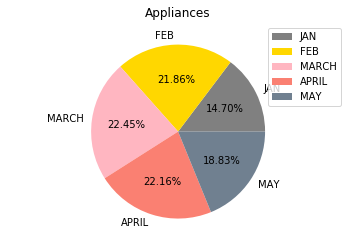

In [19]:
#To calculate the contribution of each month in the total appliances consumption including the Jan month

total_sum = df['Appliances'].sum()
df_1 = first_month['Appliances'].sum()
total_sum_1 = total_sum - df_1
df_2 = second_month['Appliances'].sum()
df_3 = third_month['Appliances'].sum()
df_4 = forth_month['Appliances'].sum()
df_5 = fifth_month['Appliances'].sum()

final_1 = (( df_1)/total_sum)*100
final_2 = (( df_2)/total_sum)*100
final_3 = (( df_3)/total_sum)*100
final_4 = (( df_4)/total_sum)*100
final_5 = (( df_5)/total_sum)*100

# analysing with pie chart

x1 = final_1
x2 = final_2
x3 = final_3
x4 = final_4
x5 = final_5
fig = plt.figure()
graph = fig.add_subplot(1,1,1,facecolor='lightgrey')
graph.axis("equal")
graph.pie([x1 ,x2,x3,x4,x5] ,colors=['grey','gold','lightpink','salmon','slategray'] , labels =['JAN','FEB','MARCH','APRIL','MAY'],autopct='%.2f%%')
graph.legend()
plt.title('Appliances')
plt.show()
#plt.savefig('pie appliances.png')

### This pie chart gives us idea about which month has maximum energy consumption in Wh. 
### March > April > February > May > Jan

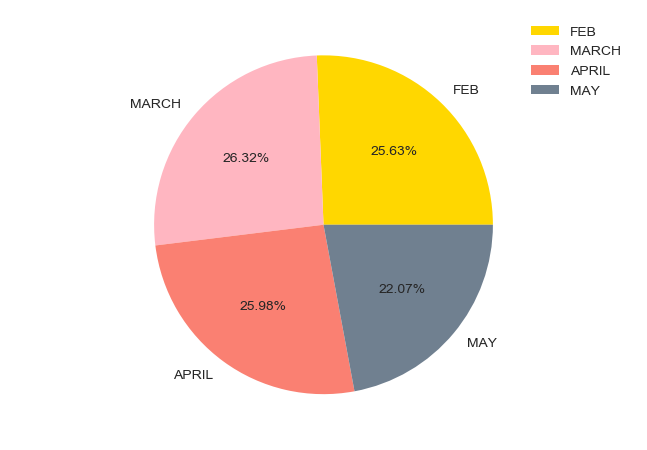

In [24]:
#To calculate the contribution of each month in the total appliances consumption

total_sum = df['Appliances'].sum()
df_1 = first_month['Appliances'].sum()
total_sum_1 = total_sum - df_1
df_2 = second_month['Appliances'].sum()
df_3 = third_month['Appliances'].sum()
df_4 = forth_month['Appliances'].sum()
df_5 = fifth_month['Appliances'].sum()

final_1 = (( df_1)/total_sum_1)*100
final_2 = (( df_2)/total_sum_1)*100
final_3 = (( df_3)/total_sum_1)*100
final_4 = (( df_4)/total_sum_1)*100
final_5 = (( df_5)/total_sum_1)*100

# analysing with pie chart

x1 = final_1
x2 = final_2
x3 = final_3
x4 = final_4
x5 = final_5
fig = plt.figure()
graph = fig.add_subplot(1,1,1,facecolor='lightgrey')
graph.axis("equal")
graph.pie([x2,x3,x4,x5] ,colors=['gold','lightpink','salmon','slategray'] , labels =['FEB','MARCH','APRIL','MAY'],autopct='%.2f%%')
graph.legend()
plt.show()

### In the month  of Jan there is no first week data given , so excluding that , the result is :

### * Appliances usage : March >April>Feb>May*

### 3.ANALYSING LIGHT 

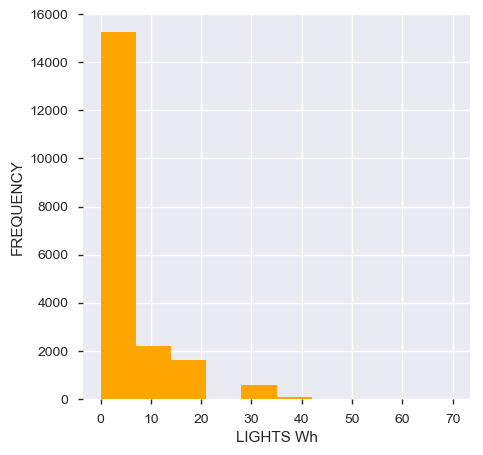

In [25]:
plt.figure(figsize=(5, 5))
plt.hist(df['lights'] ,color = 'Orange')
plt.xlabel('LIGHTS Wh')
plt.ylabel('FREQUENCY')
#plt.title('ANALYSIS OF LIGHT USAGE IN Wh')
plt.show()

#### Detecting outliers

In [67]:
trace0 = go.Box(x=df.lights)

data = [trace0]
py.iplot(data)

### From this , it is clear that '0' Wh is the maximum usage of light fixtures.

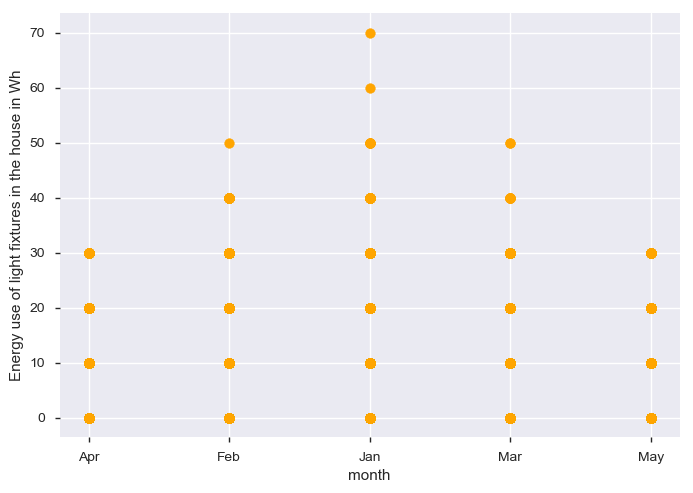

In [26]:
plt.scatter(df['month'] , df['lights'] , color = 'Orange')
plt.xlabel('month')
plt.ylabel('Energy use of light fixtures in the house in Wh')
plt.show()

### Month of January has used the maxinum value of light whihc is 70 Wh folowed by February ,March and April ,May.

### ANALYSING LIGHT WITH RESPECT TO MONTH AND TIME 

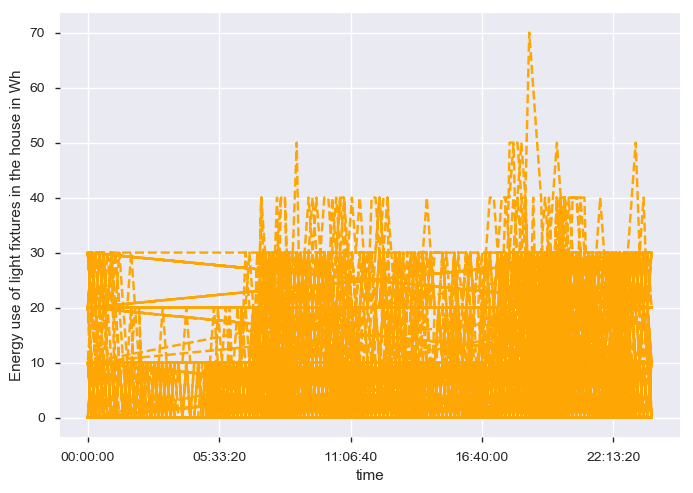

In [27]:
plt.plot(df['time'] , df['lights'] ,linestyle='--', alpha = 5 ,color ='Orange')
plt.xlabel('time')
plt.ylabel('Energy use of light fixtures in the house in Wh')
plt.show()


#### *1. From the graph , we can conclude that there is a hike in the light usage between 19:00 to 19:30 and the usage is constant between 12 midnight to 5:30 am which is similar to the graph that we obtained in appliances vs time.*

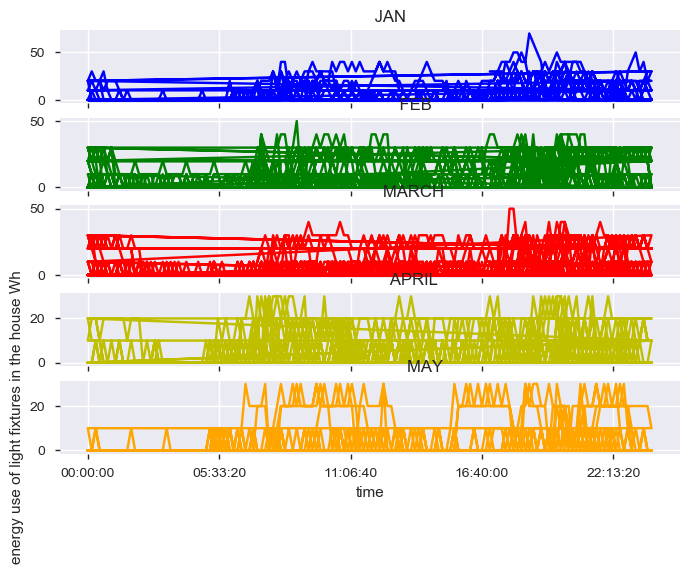

In [28]:
#analysing energy use of light fixtures in the house every month with respect to time

plt.figure(figsize=(1,1))
fig, axarr = plt.subplots(5, 1)
axarr[0].plot(first_month['time'] , first_month['lights'] ,color ='b')# , axarr[0,0])
axarr[0].set_title('         JAN')
axarr[1].plot(second_month['time'] ,second_month['lights'] ,color ='g')
axarr[1].set_title('                    FEB')
axarr[2].plot(third_month['time'] , third_month['lights'] ,color ='r')
axarr[2].set_title('                   MARCH')
axarr[3].plot(forth_month['time'] , forth_month['lights'] ,color ='y')
axarr[3].set_title('                   APRIL')
axarr[4].plot(fifth_month['time'] , fifth_month['lights'] ,color ='Orange')
axarr[4].set_title('                        MAY')
#plt.tight_layout #(pad=0.4), w_pad=0.5) , h_pad=10.0)
plt.xlabel('time')
plt.ylabel('energy use of light fixtures in the house Wh')
plt.show()

#### *1.  Usage of light from 12 midnight to  5:30 am is low for every month.*
#### *2.  Peak is seen between 19:00 to 19:30 in Jan , Feb and March.*

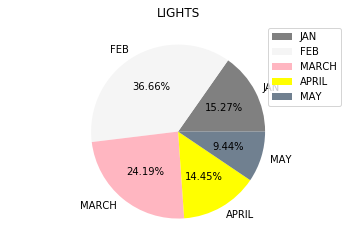

In [18]:
#To calculate the energy use of light fixtures in the house each month with Jan

lights_sum = df['lights'].sum()
final_lights_1 = first_month['lights'].sum()
lights_sum_1 = lights_sum - final_lights_1
lights_2 = second_month['lights'].sum()
lights_3 =third_month['lights'].sum()
lights_4 = forth_month['lights'].sum()
lights_5 = fifth_month['lights'].sum()

#final_1 = (( lights_1)/lights_sum)*100
final_2 = (( lights_2)/lights_sum)*100
final_3 = (( lights_3)/lights_sum)*100
final_4 = (( lights_4)/lights_sum)*100
final_5 = (( lights_5)/lights_sum)*100

# analysing with pie chart

lights_1 = final_1
lights_2 = final_2
lights_3 = final_3
lights_4 = final_4
lights_5 = final_5
fig = plt.figure()
graph = fig.add_subplot(1,1,1,facecolor='lightgrey')
graph.axis("equal")
graph.pie([lights_1,lights_2,lights_3,lights_4,lights_5] ,colors=['grey','whitesmoke','lightpink','yellow','slategray'] , labels =['JAN','FEB','MARCH','APRIL','MAY'],autopct='%.2f%%')
graph.legend()
plt.title('LIGHTS')
plt.show()


### Calulating which month has contributed more to the light usage :
### February > March > January >April >May

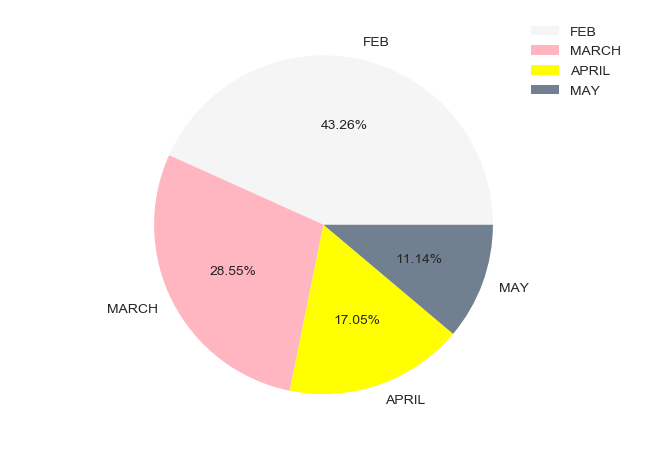

In [32]:
#To calculate the energy use of light fixtures in the house each month excluding Jan

lights_sum = df['lights'].sum()
final_lights_1 = first_month['lights'].sum()
lights_sum_1 = lights_sum - final_lights_1
lights_2 = second_month['lights'].sum()
lights_3 =third_month['lights'].sum()
lights_4 = forth_month['lights'].sum()
lights_5 = fifth_month['lights'].sum()

#final_1 = (( lights_1)/lights_sum)*100
final_2 = (( lights_2)/lights_sum_1)*100
final_3 = (( lights_3)/lights_sum_1)*100
final_4 = (( lights_4)/lights_sum_1)*100
final_5 = (( lights_5)/lights_sum_1)*100

# analysing with pie chart

#lights_1 = final_1
lights_2 = final_2
lights_3 = final_3
lights_4 = final_4
lights_5 = final_5
fig = plt.figure()
graph = fig.add_subplot(1,1,1,facecolor='lightgrey')
graph.axis("equal")
graph.pie([lights_2,lights_3,lights_4,lights_5] ,colors=['whitesmoke','lightpink','yellow','slategray'] , labels =[ 'FEB','MARCH','APRIL','MAY'],autopct='%.2f%%')
graph.legend()
plt.show()


### Since one week data is not present for January month , this pie chart is calculated by excluding that month.

### * Light usage : Feb >March>April>May*

### With January or without January , May is the least in light usage and appliances usage. From this what can be concluded is that , there is no influence of seasons in this.

### From appliances usuage and light usage , we can see that March has more energy usage and May has the least energy usage.

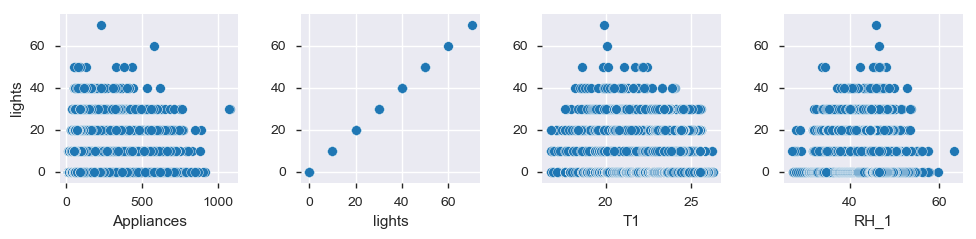

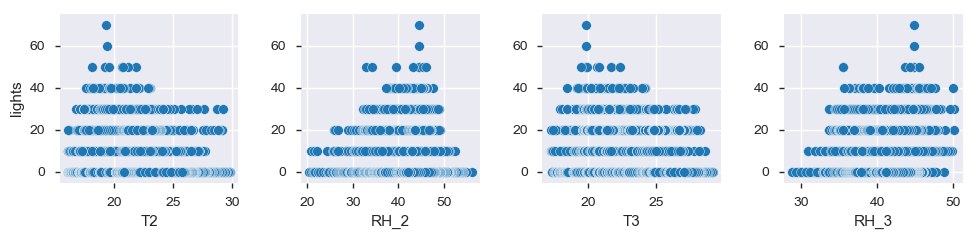

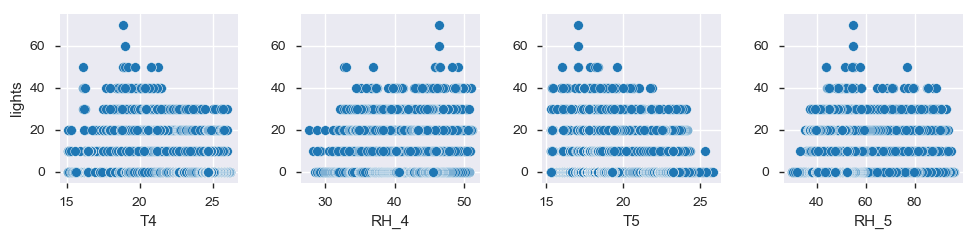

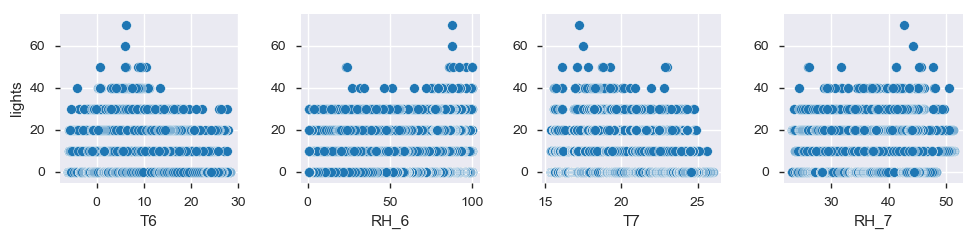

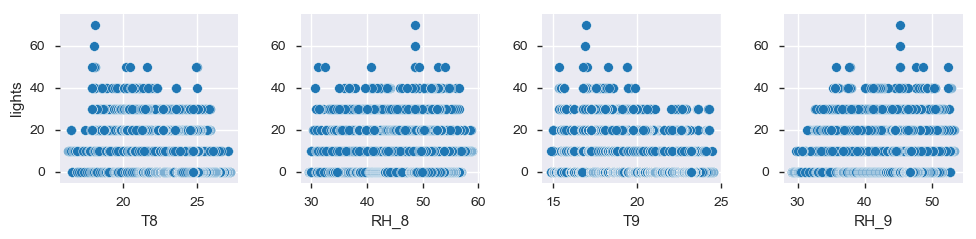

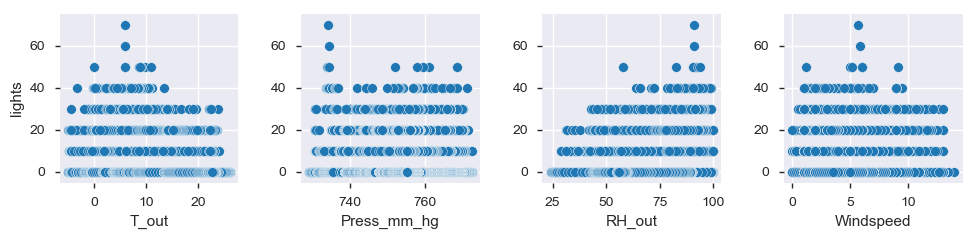

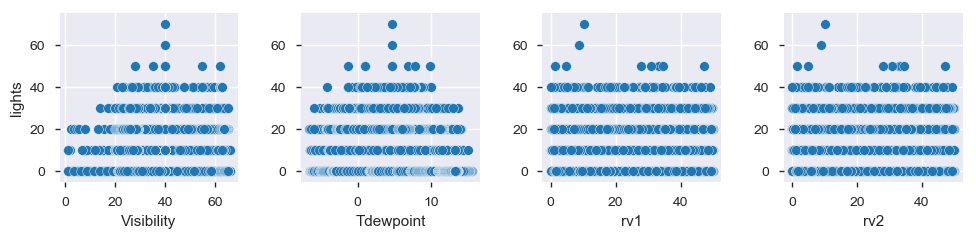

In [33]:
for i in range(0, len(df.columns)-10 , 4):
    sns.pairplot(data=df,
                x_vars=df.columns[i+1:i+5],
                y_vars=["lights"])
plt.show()


### NO CONCRETE CONCLUSIONS CAN BE DRAWN FROM THIS

### 4.Analysing Temperature

#### KEY WORDS:
#####    T1, Temperature in kitchen area, in Celsius
#####    T2, Temperature in living room area, in Celsius
#####    T3, Temperature in laundry room area
#####    T4, Temperature in office room, in Celsius
#####    T5, Temperature in bathroom, in Celsius
#####    T6, Temperature outside the building (north side), in Celsius
#####    T7, Temperature in ironing room , in Celsius
#####    T8, Temperature in teenager room 2, in Celsius
#####    T9, Temperature in parents room, in Celsius

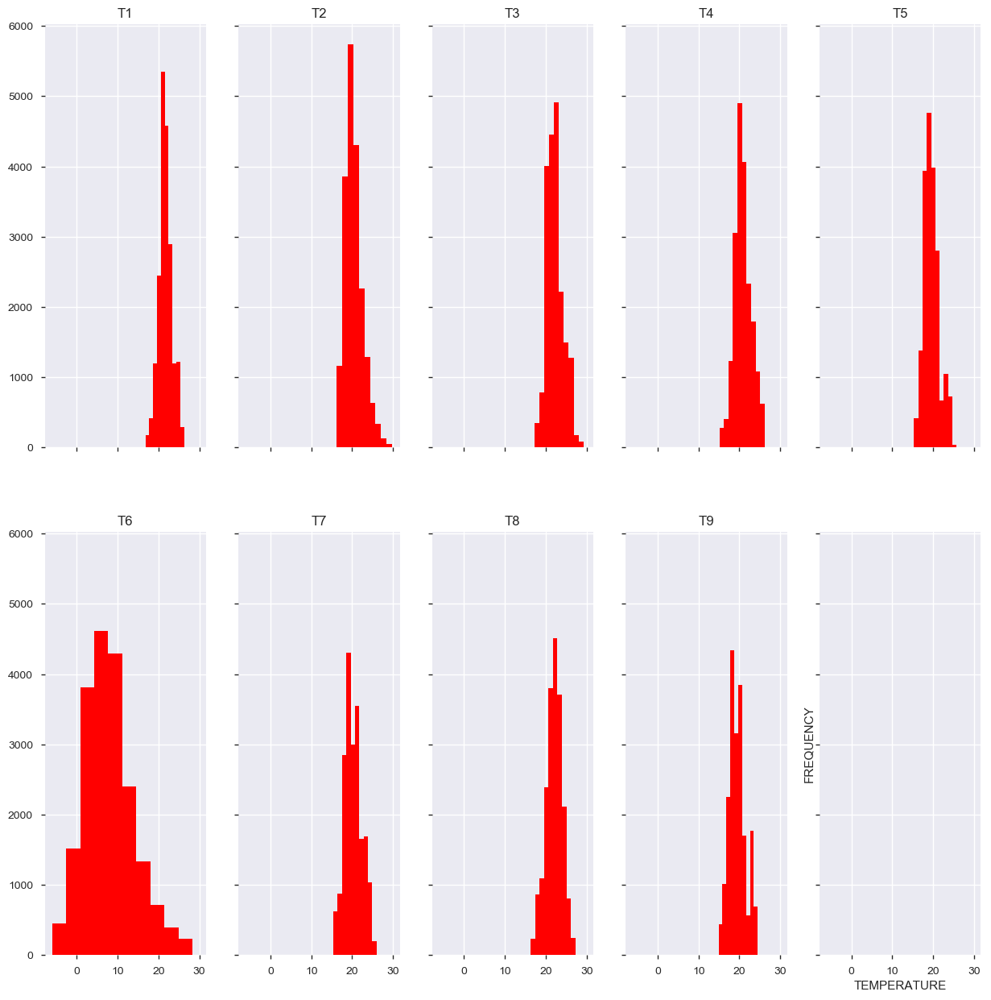

In [34]:
#plt.figure(figsize=(1,1))
f,axarr=plt.subplots(2,5 ,figsize=(15,15) , sharex=True , sharey=True)
axarr[0,0].hist(df['T1'] ,color = 'r')
axarr[0,0].set_title('T1')
axarr[0,1].hist(df['T2'] ,color = 'r')
axarr[0,1].set_title('T2')
axarr[0,2].hist(df['T3'] ,color = 'r')
axarr[0,2].set_title('T3')
axarr[0,3].hist(df['T4'] ,color = 'r')
axarr[0,3].set_title('T4')
axarr[0,4].hist(df['T5'] ,color = 'r')
axarr[0,4].set_title('T5')
axarr[1,0].hist(df['T6'] ,color = 'r')
axarr[1,0].set_title('T6')
axarr[1,1].hist(df['T7'] ,color = 'r')
axarr[1,1].set_title('T7')
axarr[1,2].hist(df['T8'] ,color = 'r')
axarr[1,2].set_title('T8')
axarr[1,3].hist(df['T9'] ,color = 'r')
axarr[1,3].set_title('T9')
plt.xlabel('TEMPERATURE')
plt.ylabel('FREQUENCY')
#plt.tight_layout()
#plt.title('ANALYSIS OF LIGHT USAGE IN Wh')
plt.show()

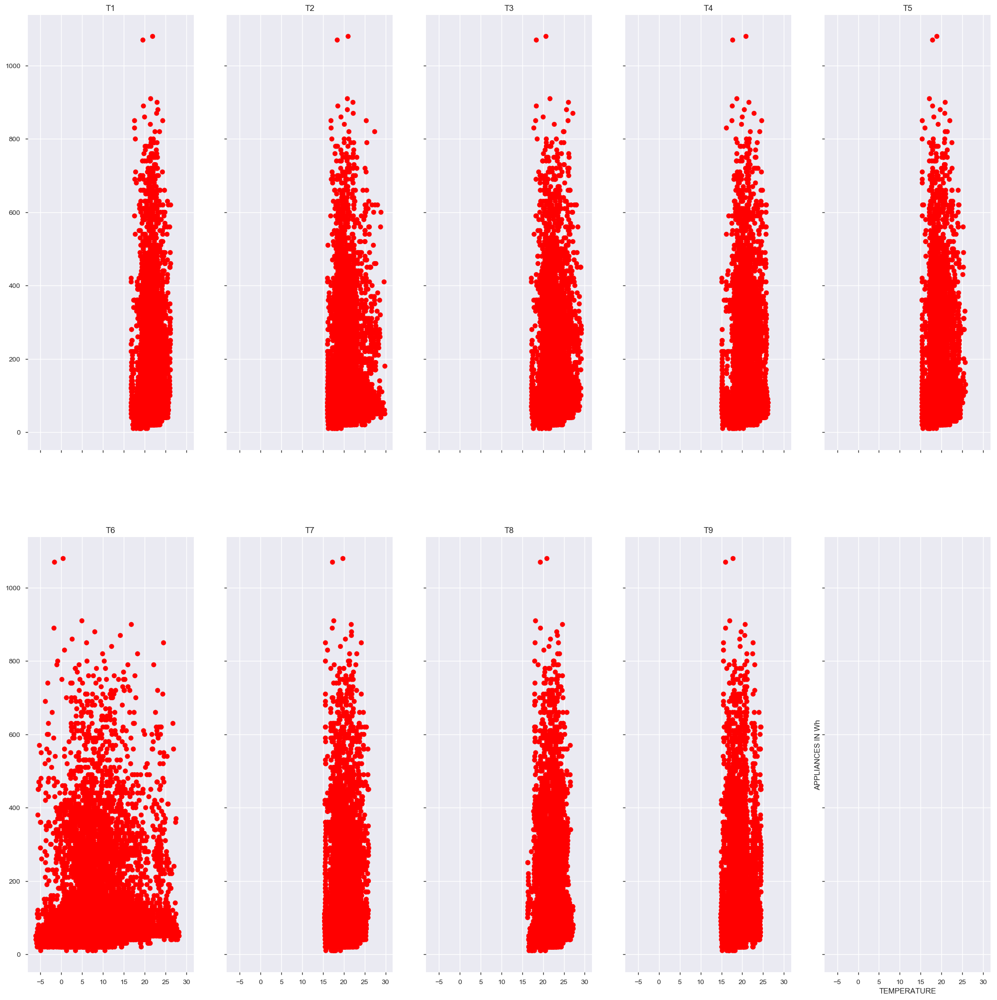

In [35]:
# Analysing Temperatures with respect to appliances

f,axarr=plt.subplots(2,5 ,figsize=(25,25) , sharex=True , sharey=True)
axarr[0,0].scatter(df['T1'],df['Appliances'] ,linestyle='--',color ='r')
axarr[0,0].set_title('T1')
axarr[0,1].scatter( df['T2'],df['Appliances'] ,linestyle='--'  ,color ='r')
axarr[0,1].set_title('T2')
axarr[0,2].scatter( df['T3'] ,df['Appliances'],linestyle='--' ,color = 'r')
axarr[0,2].set_title('T3')
axarr[0,3].scatter(df['T4'],df['Appliances'] ,linestyle='--',color = 'r')
axarr[0,3].set_title('T4')
axarr[0,4].scatter( df['T5'],df['Appliances'] ,linestyle='--' ,color = 'r')
axarr[0,4].set_title('T5')
axarr[1,0].scatter( df['T6'] ,df['Appliances'] ,linestyle='--',color = 'r')
axarr[1,0].set_title('T6')
axarr[1,1].scatter( df['T7'],df['Appliances'] ,linestyle='--',color = 'r')
axarr[1,1].set_title('T7')
axarr[1,2].scatter( df['T8'],df['Appliances'] ,linestyle='--',color = 'r')
axarr[1,2].set_title('T8')
axarr[1,3].scatter( df['T9'],df['Appliances'] ,linestyle='--',color = 'r')
axarr[1,3].set_title('T9')
plt.xlabel('TEMPERATURE')
plt.ylabel('APPLIANCES IN Wh')
plt.show()

### * All the temperatures are between 15 degrees to 25 degrees and only T6 is in negative.* 
### Another interesting point is that , all the other plots are similar , except for T6 where , there is a peak in the appliances usage when the temperature outside is negative.

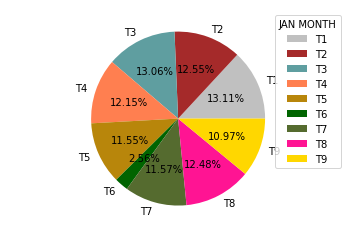

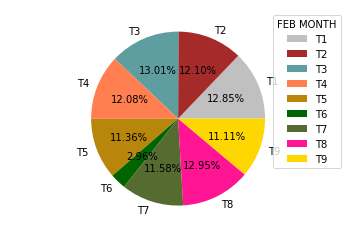

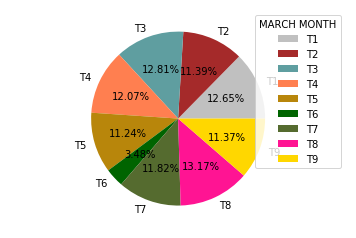

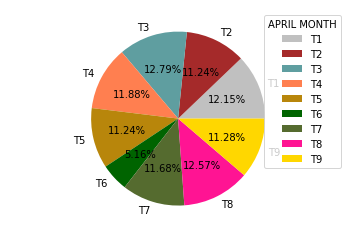

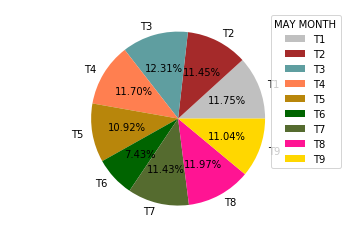

In [19]:
t_total_jan   = [first_month['T1'].mean() , first_month['T2'].mean() , first_month['T3'].mean() , first_month['T4'].mean() ,first_month['T5'].mean() ,first_month['T6'].mean() ,first_month['T7'].mean() ,first_month['T8'].mean() ,first_month['T9'].mean()]
t_total_feb   = [second_month['T1'].mean() , second_month['T2'].mean() , second_month['T3'].mean() , second_month['T4'].mean() ,second_month['T5'].mean() ,second_month['T6'].mean() ,second_month['T7'].mean() ,second_month['T8'].mean() ,second_month['T9'].mean()]
t_total_march = [third_month['T1'].mean() , third_month['T2'].mean() , third_month['T3'].mean() , third_month['T4'].mean() ,third_month['T5'].mean() ,third_month['T6'].mean() ,third_month['T7'].mean() ,third_month['T8'].mean() ,third_month['T9'].mean()]
t_total_april = [forth_month['T1'].mean() , forth_month['T2'].mean() , forth_month['T3'].mean() , forth_month['T4'].mean() ,forth_month['T5'].mean() ,forth_month['T6'].mean() ,forth_month['T7'].mean() ,forth_month['T8'].mean() ,forth_month['T9'].mean()]
t_total_may   = [fifth_month['T1'].mean() , fifth_month['T2'].mean() , fifth_month['T3'].mean() , fifth_month['T4'].mean() ,fifth_month['T5'].mean() ,fifth_month['T6'].mean() ,fifth_month['T7'].mean() ,fifth_month['T8'].mean() ,fifth_month['T9'].mean()]

t_total_jan_1   = sum(t_total_jan)
t_total_feb_2   = sum(t_total_feb)
t_total_march_3 = sum(t_total_march)
t_total_april_4 = sum(t_total_april)
t_total_may_5   = sum(t_total_may)

#print(t_total_jan_1)

#plots= df.Appliances[:9]
#plt.plot(t_total_jan ,plots)
#plt.show()

# MONTH - JAN
t_total_1_1 = (first_month['T1'].mean() /t_total_jan_1)*100
t_total_1_2 = (first_month['T2'].mean() /t_total_jan_1)*100
t_total_1_3 = (first_month['T3'].mean() /t_total_jan_1)*100
t_total_1_4 = (first_month['T4'].mean() /t_total_jan_1)*100
t_total_1_5 = (first_month['T5'].mean() /t_total_jan_1)*100
t_total_1_6 = (first_month['T6'].mean() /t_total_jan_1)*100
t_total_1_7 = (first_month['T7'].mean() /t_total_jan_1)*100
t_total_1_8 = (first_month['T8'].mean() /t_total_jan_1)*100
t_total_1_9 = (first_month['T9'].mean() /t_total_jan_1)*100


temp_jan_1  = t_total_1_1
temp_jan_2  = t_total_1_2
temp_jan_3  = t_total_1_3
temp_jan_4  = t_total_1_4
temp_jan_5  = t_total_1_5
temp_jan_6  = t_total_1_6
temp_jan_7  = t_total_1_7
temp_jan_8  = t_total_1_8
temp_jan_9  = t_total_1_9
fig = plt.figure()
graph = fig.add_subplot(1,1,1,facecolor='lightgrey')
graph.axis("equal")
graph.pie([temp_jan_1,temp_jan_2,temp_jan_3,temp_jan_4,temp_jan_5,temp_jan_6,temp_jan_7,temp_jan_8,temp_jan_9] , colors =['silver','brown','cadetblue','coral','darkgoldenrod','darkgreen','darkolivegreen','deeppink','gold'],labels =['T1','T2','T3','T4','T5','T6','T7','T8','T9'],autopct='%.2f%%')
graph.legend(title='JAN MONTH')
#plt.show()

# MONTH - FEB
t_total_2_1 = (second_month['T1'].mean() /t_total_feb_2)*100
t_total_2_2 = (second_month['T2'].mean() /t_total_feb_2)*100
t_total_2_3 = (second_month['T3'].mean() /t_total_feb_2)*100
t_total_2_4 = (second_month['T4'].mean() /t_total_feb_2)*100
t_total_2_5 = (second_month['T5'].mean() /t_total_feb_2)*100
t_total_2_6 = (second_month['T6'].mean() /t_total_feb_2)*100
t_total_2_7 = (second_month['T7'].mean() /t_total_feb_2)*100
t_total_2_8 = (second_month['T8'].mean() /t_total_feb_2)*100
t_total_2_9 = (second_month['T9'].mean() /t_total_feb_2)*100

temp_feb_1  = t_total_2_1
temp_feb_2  = t_total_2_2
temp_feb_3  = t_total_2_3
temp_feb_4  = t_total_2_4
temp_feb_5  = t_total_2_5
temp_feb_6  = t_total_2_6
temp_feb_7  = t_total_2_7
temp_feb_8  = t_total_2_8
temp_feb_9  = t_total_2_9

fig = plt.figure()
graph = fig.add_subplot(1,1,1,facecolor='lightgrey')
graph.axis("equal")
graph.pie([temp_feb_1,temp_feb_2,temp_feb_3,temp_feb_4,temp_feb_5,temp_feb_6,temp_feb_7,temp_feb_8,temp_feb_9] , colors =['silver','brown','cadetblue','coral','darkgoldenrod','darkgreen','darkolivegreen','deeppink','gold'],labels =['T1','T2','T3','T4','T5','T6','T7','T8','T9'],autopct='%.2f%%')
graph.legend(title='FEB MONTH')
#plt.show()
 
# MONTH- MARCH
t_total_3_1 = (third_month['T1'].mean() /t_total_march_3)*100
t_total_3_2 = (third_month['T2'].mean() /t_total_march_3)*100
t_total_3_3 = (third_month['T3'].mean() /t_total_march_3)*100
t_total_3_4 = (third_month['T4'].mean() /t_total_march_3)*100
t_total_3_5 = (third_month['T5'].mean() /t_total_march_3)*100
t_total_3_6 = (third_month['T6'].mean() /t_total_march_3)*100
t_total_3_7 = (third_month['T7'].mean() /t_total_march_3)*100
t_total_3_8 = (third_month['T8'].mean() /t_total_march_3)*100
t_total_3_9 = (third_month['T9'].mean() /t_total_march_3)*100

temp_march_1  = t_total_3_1
temp_march_2  = t_total_3_2
temp_march_3  = t_total_3_3
temp_march_4  = t_total_3_4
temp_march_5  = t_total_3_5
temp_march_6  = t_total_3_6
temp_march_7  = t_total_3_7
temp_march_8  = t_total_3_8
temp_march_9  = t_total_3_9

fig = plt.figure()
graph = fig.add_subplot(1,1,1,facecolor='lightgrey')
graph.axis("equal")
graph.pie([temp_march_1,temp_march_2,temp_march_3,temp_march_4,temp_march_5,temp_march_6,temp_march_7,temp_march_8,temp_march_9] , colors =['silver','brown','cadetblue','coral','darkgoldenrod','darkgreen','darkolivegreen','deeppink','gold'],labels =['T1','T2','T3','T4','T5','T6','T7','T8','T9'],autopct='%.2f%%')
graph.legend(title='MARCH MONTH')

# MONTH - APRIL 
t_total_4_1 = (forth_month['T1'].mean() /t_total_april_4)*100
t_total_4_2 = (forth_month['T2'].mean() /t_total_april_4)*100
t_total_4_3 = (forth_month['T3'].mean() /t_total_april_4)*100
t_total_4_4 = (forth_month['T4'].mean() /t_total_april_4)*100
t_total_4_5 = (forth_month['T5'].mean() /t_total_april_4)*100
t_total_4_6 = (forth_month['T6'].mean() /t_total_april_4)*100
t_total_4_7 = (forth_month['T7'].mean() /t_total_april_4)*100
t_total_4_8 = (forth_month['T8'].mean() /t_total_april_4)*100
t_total_4_9 = (forth_month['T9'].mean() /t_total_april_4)*100

temp_april_1  = t_total_4_1
temp_april_2  = t_total_4_2
temp_april_3  = t_total_4_3
temp_april_4  = t_total_4_4
temp_april_5  = t_total_4_5
temp_april_6  = t_total_4_6
temp_april_7  = t_total_4_7
temp_april_8  = t_total_4_8
temp_april_9  = t_total_4_9

fig = plt.figure()
graph = fig.add_subplot(1,1,1,facecolor='lightgrey')
graph.axis("equal")
graph.pie([temp_april_1,temp_april_2,temp_april_3,temp_april_4,temp_april_5,temp_april_6,temp_april_7,temp_april_8,temp_april_9] , colors =['silver','brown','cadetblue','coral','darkgoldenrod','darkgreen','darkolivegreen','deeppink','gold'],labels =['T1','T2','T3','T4','T5','T6','T7','T8','T9'],autopct='%.2f%%')
graph.legend(title='APRIL MONTH')

# MONTH - MAY
t_total_5_1 = (fifth_month['T1'].mean() /t_total_may_5)*100
t_total_5_2 = (fifth_month['T2'].mean() /t_total_may_5)*100
t_total_5_3 = (fifth_month['T3'].mean() /t_total_may_5)*100
t_total_5_4 = (fifth_month['T4'].mean() /t_total_may_5)*100
t_total_5_5 = (fifth_month['T5'].mean() /t_total_may_5)*100
t_total_5_6 = (fifth_month['T6'].mean() /t_total_may_5)*100
t_total_5_7 = (fifth_month['T7'].mean() /t_total_may_5)*100
t_total_5_8 = (fifth_month['T8'].mean() /t_total_may_5)*100
t_total_5_9 = (fifth_month['T9'].mean() /t_total_may_5)*100

temp_may_1  = t_total_5_1
temp_may_2  = t_total_5_2
temp_may_3  = t_total_5_3
temp_may_4  = t_total_5_4
temp_may_5  = t_total_5_5
temp_may_6  = t_total_5_6
temp_may_7  = t_total_5_7
temp_may_8  = t_total_5_8
temp_may_9  = t_total_5_9

fig = plt.figure()                                                            #take abs value of T6
graph = fig.add_subplot(1,1,1,facecolor='lightgrey')
graph.axis("equal")
graph.pie([temp_may_1,temp_may_2,temp_may_3,temp_may_4,temp_may_5,temp_may_6,temp_may_7,temp_may_8,temp_may_9] , colors =['silver','brown','cadetblue','coral','darkgoldenrod','darkgreen','darkolivegreen','deeppink','gold'],labels =['T1','T2','T3','T4','T5','T6','T7','T8','T9'],autopct='%.2f%%')
graph.legend(title='MAY MONTH')
plt.show()

### Out of all ,T6 has contributed less  to the overall temperature of the house in every month which means its correlation with applainces should be zero or close to zero.

### Out of all the temperatures in the rooms that is present inside the house , T3 has the highest contribution follwed by T1 and T8.

C:\Users\Dell-pc\Anaconda3\lib\site-packages\matplotlib\pyplot.py:523: RuntimeWarning:

More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).



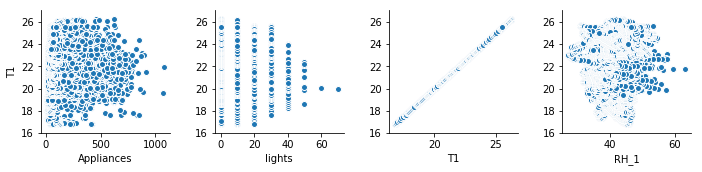

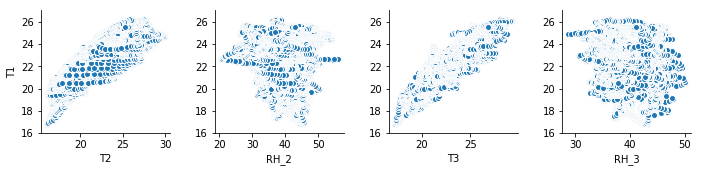

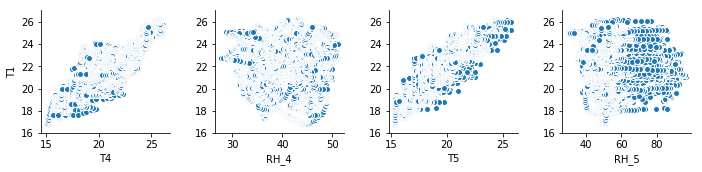

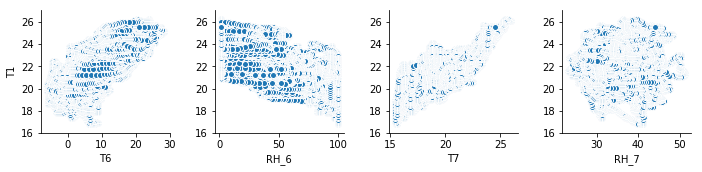

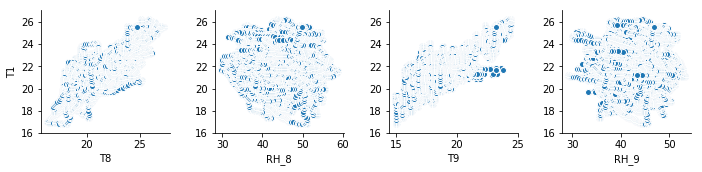

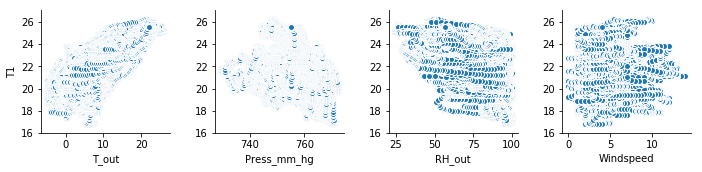

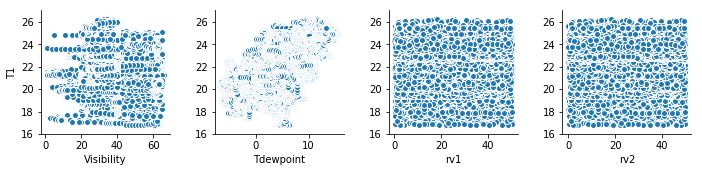

ValueError: microsecond must be in 0..999999

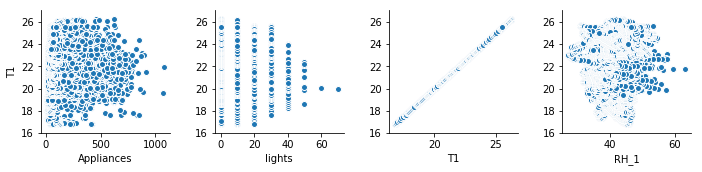

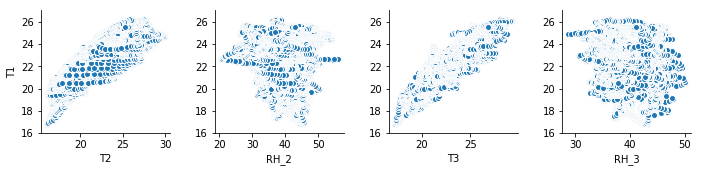

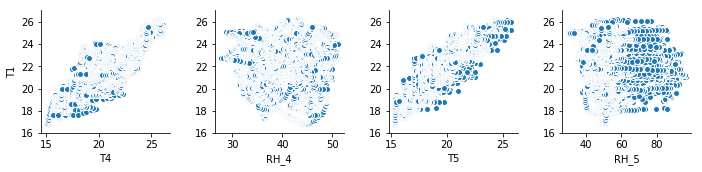

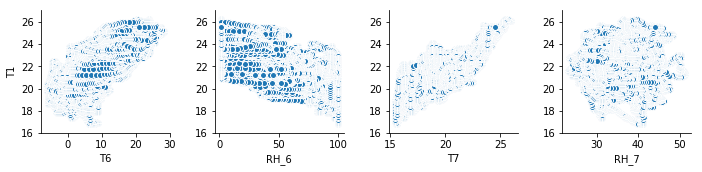

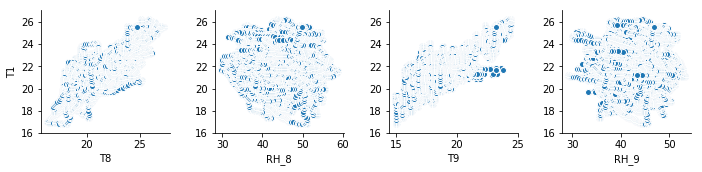

...

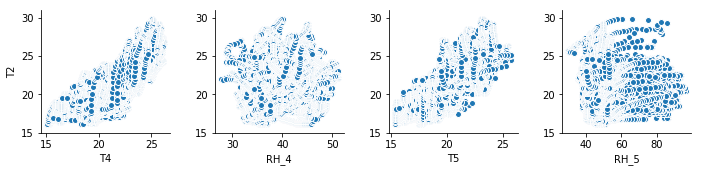

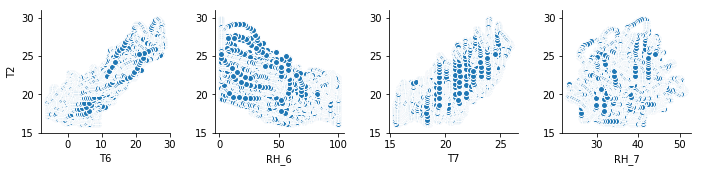

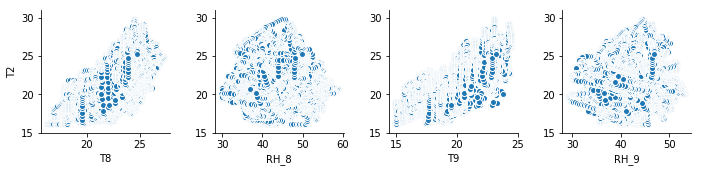

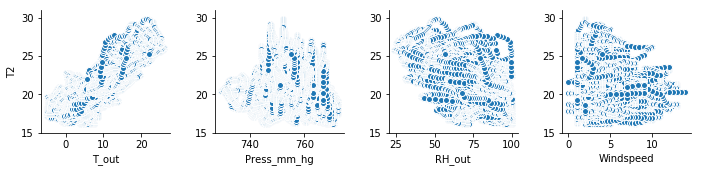

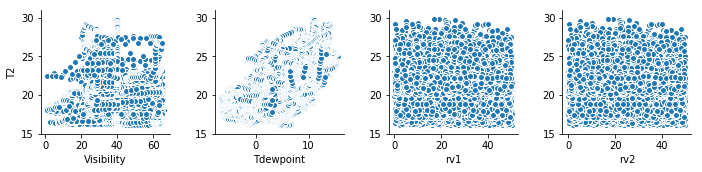

ValueError: microsecond must be in 0..999999

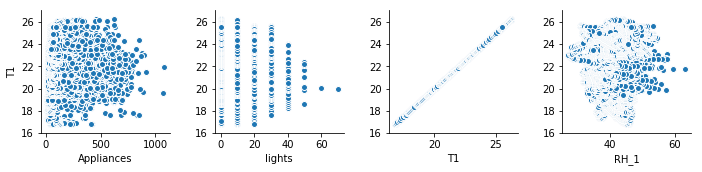

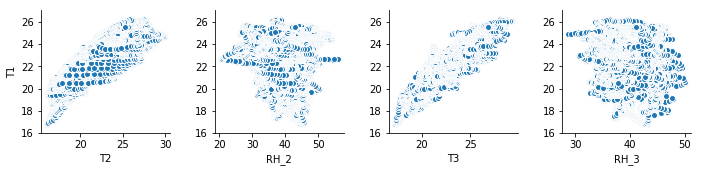

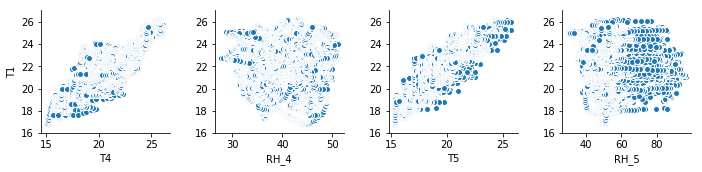

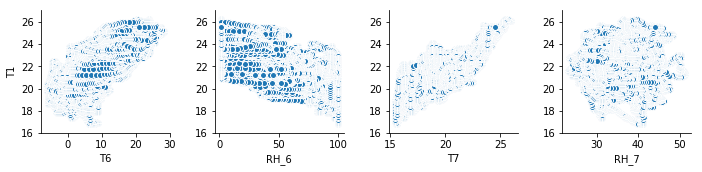

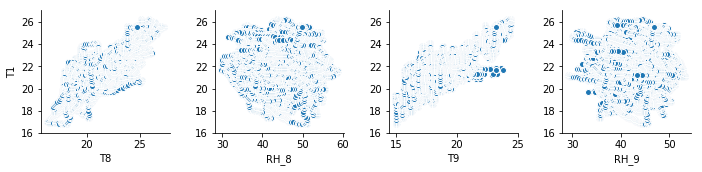

...

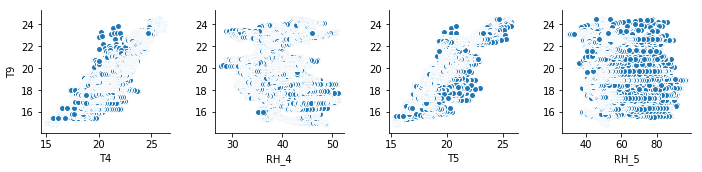

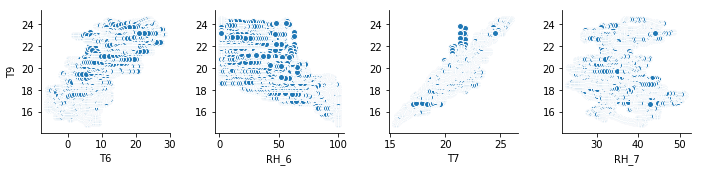

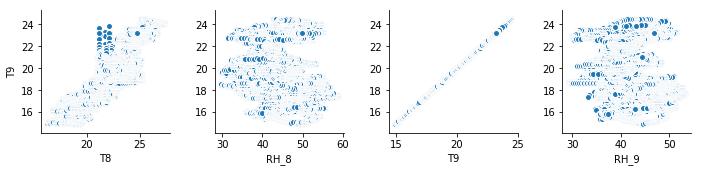

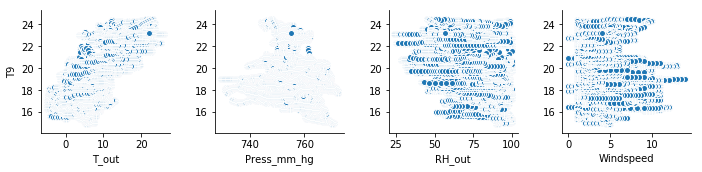

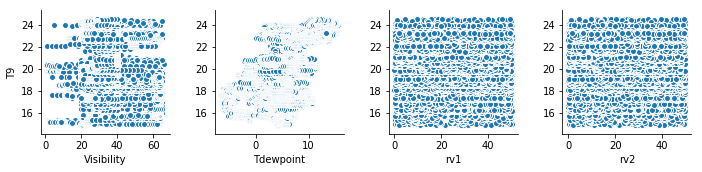

In [7]:
for i in range(0, len(df.columns)-10 , 4):
    sns.pairplot(data=df,
                x_vars=df.columns[i+1:i+5],
                y_vars=["T1"])
#plt.show()

for i in range(0, len(df.columns)-10 , 4):
    sns.pairplot(data=df,
                x_vars=df.columns[i+1:i+5],
                y_vars=["T2"])
#plt.show()

for i in range(0, len(df.columns)-10 , 4):
    sns.pairplot(data=df,
                x_vars=df.columns[i+1:i+5],
                y_vars=["T3"])

for i in range(0, len(df.columns)-10 , 4):
    sns.pairplot(data=df,
                x_vars=df.columns[i+1:i+5],
                y_vars=["T4"])

for i in range(0, len(df.columns)-10 , 4):
    sns.pairplot(data=df,
                x_vars=df.columns[i+1:i+5],
                y_vars=["T5"])

for i in range(0, len(df.columns)-10 , 4):
    sns.pairplot(data=df,
                x_vars=df.columns[i+1:i+5],
                y_vars=["T6"])

for i in range(0, len(df.columns)-10 , 4):
    sns.pairplot(data=df,
                x_vars=df.columns[i+1:i+5],
                y_vars=["T7"])

for i in range(0, len(df.columns)-10 , 4):
    sns.pairplot(data=df,
                x_vars=df.columns[i+1:i+5],
                y_vars=["T8"])

for i in range(0, len(df.columns)-10 , 4):
    sns.pairplot(data=df,
                x_vars=df.columns[i+1:i+5],
                y_vars=["T9"])
plt.show()

#### checking for outliers 

In [68]:
T1 = go.Box(x=df.T1)
T2 = go.Box(x=df.T2)
T3 = go.Box(x=df.T3)
T4 = go.Box(x=df.T4)
T5 = go.Box(x=df.T5)
T6 = go.Box(x=df.T6)
T7 = go.Box(x=df.T7)
T8 = go.Box(x=df.T8)
T9 = go.Box(x=df.T9)
#T_out = go.Box(x=df.T_out)
data = [T1,T2,T3,T4,T5,T6,T7,T8,T9]
py.iplot(data)

### From the above plots , it is clear that all the temperatures are linearly proprotional to each other.

### 5.ANALYSING HUMIDITY
#### HUMIDITY KEYS :
#### RH_1, Humidity in kitchen area, in %
#### RH_2, Humidity in living room area, in %
#### RH_3, Humidity in laundry room area, in %
#### RH_4, Humidity in office room, in %
#### RH_5, Humidity in bathroom, in %
#### RH_6, Humidity outside the building (north side), in %
#### RH_7, Humidity in ironing room, in %
#### RH_8, Humidity in teenager room 2, in %
#### RH_9, Humidity in parents room, in %

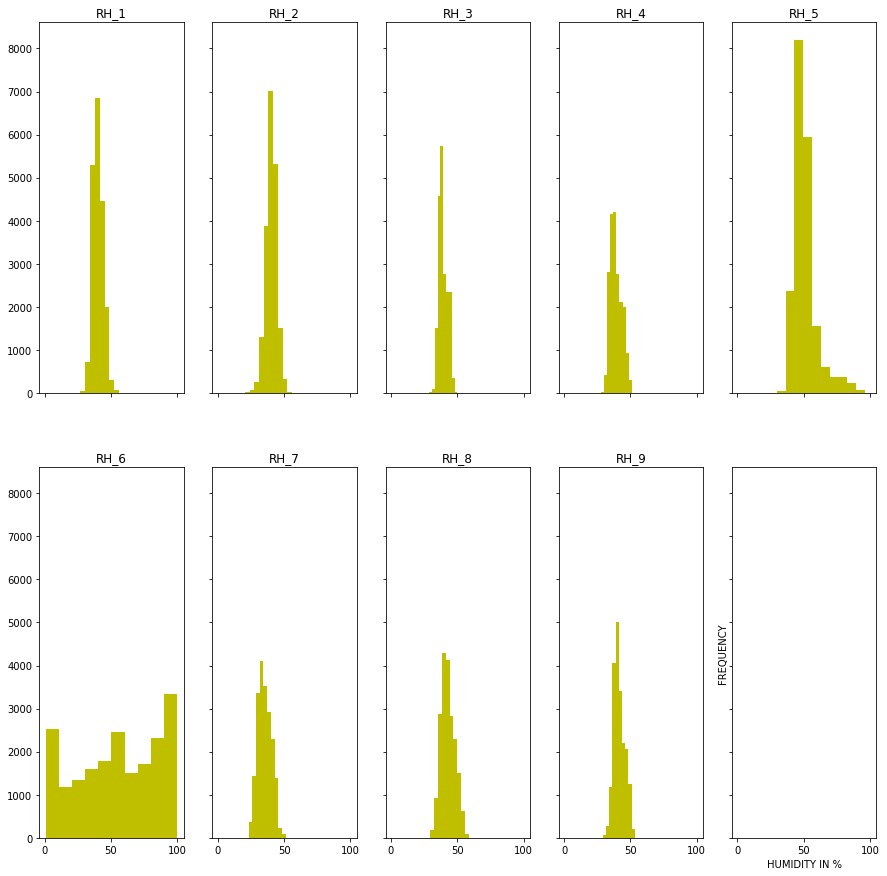

In [5]:
f,axarr=plt.subplots(2,5 ,figsize=(15,15) , sharex=True , sharey=True)
axarr[0,0].hist(df['RH_1'] ,color = 'y')
axarr[0,0].set_title('RH_1')
axarr[0,1].hist(df['RH_2'] ,color = 'y')
axarr[0,1].set_title('RH_2')
axarr[0,2].hist(df['RH_3'] ,color = 'y')
axarr[0,2].set_title('RH_3')
axarr[0,3].hist(df['RH_4'] ,color = 'y')
axarr[0,3].set_title('RH_4')
axarr[0,4].hist(df['RH_5'] ,color = 'y')
axarr[0,4].set_title('RH_5')
axarr[1,0].hist(df['RH_6'] ,color = 'y')
axarr[1,0].set_title('RH_6')
axarr[1,1].hist(df['RH_7'] ,color = 'y')
axarr[1,1].set_title('RH_7')
axarr[1,2].hist(df['RH_8'] ,color = 'y')
axarr[1,2].set_title('RH_8')
axarr[1,3].hist(df['RH_9'] ,color = 'y')
axarr[1,3].set_title('RH_9')
plt.xlabel('HUMIDITY IN %')
plt.ylabel('FREQUENCY')
#plt.tight_layout()
#plt.title('ANALYSIS OF LIGHT USAGE IN Wh')
plt.show()

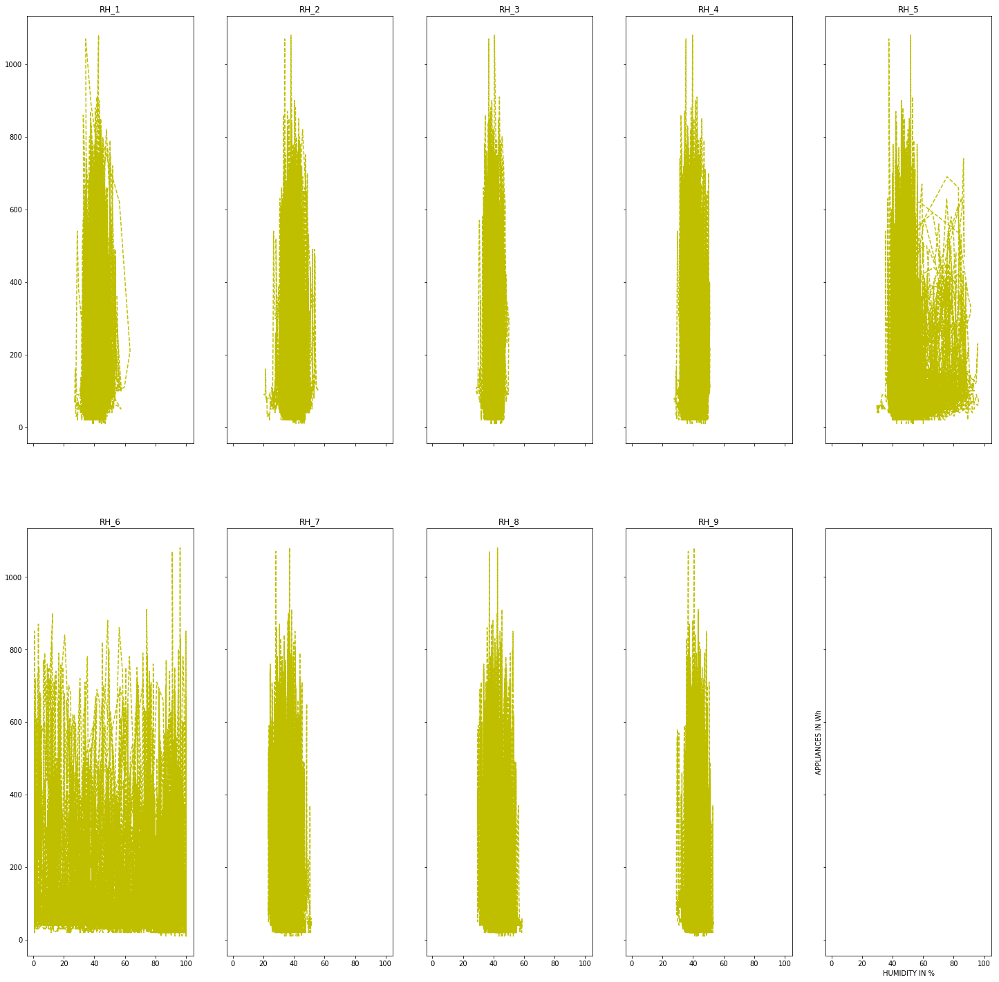

In [6]:
#analysing humidity with respect to Appliances

f,axarr=plt.subplots(2,5 ,figsize=(25,25) , sharex=True , sharey=True)
axarr[0,0].plot(df['RH_1'] ,df['Appliances'] ,linestyle='--',color ='y')
axarr[0,0].set_title('RH_1')
axarr[0,1].plot( df['RH_2'],df['Appliances'] ,linestyle='--'  ,color ='y')
axarr[0,1].set_title('RH_2')
axarr[0,2].plot( df['RH_3'] ,df['Appliances'],linestyle='--' ,color = 'y')
axarr[0,2].set_title('RH_3')
axarr[0,3].plot(df['RH_4'],df['Appliances'] ,linestyle='--',color = 'y')
axarr[0,3].set_title('RH_4')
axarr[0,4].plot( df['RH_5'],df['Appliances'] ,linestyle='--' ,color = 'y')
axarr[0,4].set_title('RH_5')
axarr[1,0].plot( df['RH_6'] ,df['Appliances'] ,linestyle='--',color = 'y')
axarr[1,0].set_title('RH_6')
axarr[1,1].plot( df['RH_7'],df['Appliances'] ,linestyle='--',color = 'y')
axarr[1,1].set_title('RH_7')
axarr[1,2].plot( df['RH_8'],df['Appliances'] ,linestyle='--',color = 'y')
axarr[1,2].set_title('RH_8')
axarr[1,3].plot( df['RH_9'],df['Appliances'] ,linestyle='--',color = 'y')
axarr[1,3].set_title('RH_9')
plt.xlabel('HUMIDITY IN %')
plt.ylabel('APPLIANCES IN Wh')
plt.show()

### Similar to Temperature outside the house , even humidity outside the house is showing a different behaviour compared to other rooms.
### RH_5 , which is bathroom has high humidity compared to other rooms , probabaly due to the use of hot water.

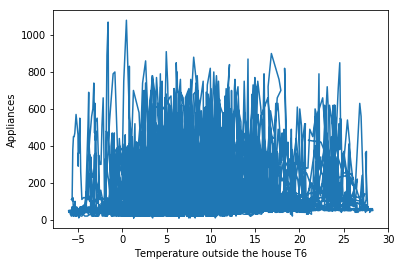

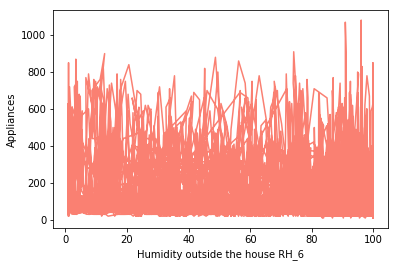

In [9]:
plt.plot(df.T6 , df.Appliances)
plt.xlabel('Temperature outside the house T6')
plt.ylabel('Appliances')
plt.show()
plt.plot(df.RH_6, df.Appliances ,color = 'salmon')
plt.xlabel('Humidity outside the house RH_6')
plt.ylabel('Appliances')
plt.show()

### First one is a graph plotted for Appliances vs T6 and second one is Appliances vs RH_6.
### From these 2 graphs we can say that , at lowest temperature and highest humidity there is a peak in the appliances usage which says these two are inversely proportional.

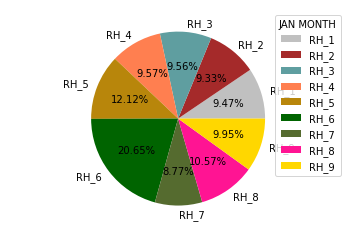

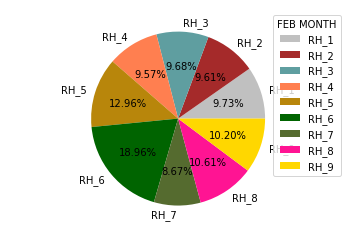

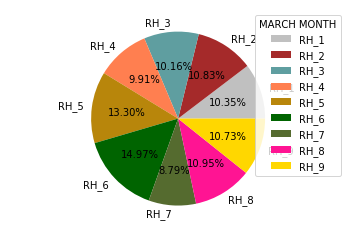

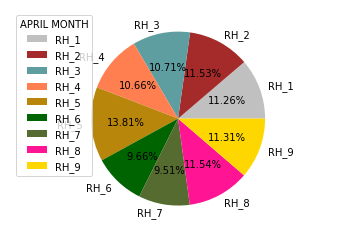

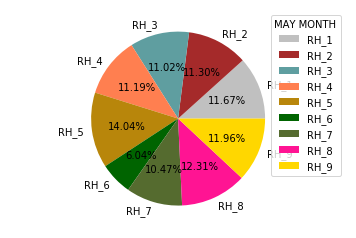

In [18]:
h_total_jan   = [first_month['RH_1'].mean() , first_month['RH_2'].mean() , first_month['RH_3'].mean() , first_month['RH_4'].mean() ,first_month['RH_5'].mean() ,first_month['RH_6'].mean() ,first_month['RH_7'].mean() ,first_month['RH_8'].mean() ,first_month['RH_9'].mean()]
h_total_feb   = [second_month['RH_1'].mean(),second_month['RH_2'].mean(), second_month['RH_3'].mean(), second_month['RH_4'].mean(),second_month['RH_5'].mean(),second_month['RH_6'].mean(),second_month['RH_7'].mean(),second_month['RH_8'].mean(),second_month['RH_9'].mean()]
h_total_march = [third_month['RH_1'].mean() , third_month['RH_2'].mean() , third_month['RH_3'].mean() , third_month['RH_4'].mean() ,third_month['RH_5'].mean() ,third_month['RH_6'].mean() ,third_month['RH_7'].mean() ,third_month['RH_8'].mean() ,third_month['RH_9'].mean()]
h_total_april = [forth_month['RH_1'].mean() , forth_month['RH_2'].mean() , forth_month['RH_3'].mean() , forth_month['RH_4'].mean() ,forth_month['RH_5'].mean() ,forth_month['RH_6'].mean() ,forth_month['RH_7'].mean() ,forth_month['RH_8'].mean() ,forth_month['RH_9'].mean()]
h_total_may   = [fifth_month['RH_1'].mean() , fifth_month['RH_2'].mean() , fifth_month['RH_3'].mean() , fifth_month['RH_4'].mean() ,fifth_month['RH_5'].mean() ,fifth_month['RH_6'].mean() ,fifth_month['RH_7'].mean() ,fifth_month['RH_8'].mean() ,fifth_month['RH_9'].mean()]

h_total_jan_1   = sum(h_total_jan)
h_total_feb_2   = sum(h_total_feb)
h_total_march_3 = sum(h_total_march)
h_total_april_4 = sum(h_total_april)
h_total_may_5   = sum(h_total_may)

#print(t_total_jan_1)

#plots= df.Appliances[:9]
#plt.plot(t_total_jan ,plots)
#plt.show()

# MONTH - JAN
h_total_1_1 = (first_month['RH_1'].mean() /h_total_jan_1)*100
h_total_1_2 = (first_month['RH_2'].mean() /h_total_jan_1)*100
h_total_1_3 = (first_month['RH_3'].mean() /h_total_jan_1)*100
h_total_1_4 = (first_month['RH_4'].mean() /h_total_jan_1)*100
h_total_1_5 = (first_month['RH_5'].mean() /h_total_jan_1)*100
h_total_1_6 = (first_month['RH_6'].mean() /h_total_jan_1)*100
h_total_1_7 = (first_month['RH_7'].mean() /h_total_jan_1)*100
h_total_1_8 = (first_month['RH_8'].mean() /h_total_jan_1)*100
h_total_1_9 = (first_month['RH_9'].mean() /h_total_jan_1)*100


humidity_jan_1  = h_total_1_1
humidity_jan_2  = h_total_1_2
humidity_jan_3  = h_total_1_3
humidity_jan_4  = h_total_1_4
humidity_jan_5  = h_total_1_5
humidity_jan_6  = h_total_1_6
humidity_jan_7  = h_total_1_7
humidity_jan_8  = h_total_1_8
humidity_jan_9  = h_total_1_9
fig = plt.figure()
graph = fig.add_subplot(1,1,1,facecolor='lightgrey')
graph.axis("equal")
graph.pie([humidity_jan_1,humidity_jan_2,humidity_jan_3,humidity_jan_4,humidity_jan_5,humidity_jan_6,humidity_jan_7,humidity_jan_8,humidity_jan_9] , colors =['silver','brown','cadetblue','coral','darkgoldenrod','darkgreen','darkolivegreen','deeppink','gold'],labels =['RH_1','RH_2','RH_3','RH_4','RH_5','RH_6','RH_7','RH_8','RH_9'],autopct='%.2f%%')
graph.legend(title='JAN MONTH')
#plt.show()

# MONTH - FEB
h_total_2_1 = (second_month['RH_1'].mean() /h_total_feb_2)*100
h_total_2_2 = (second_month['RH_2'].mean() /h_total_feb_2)*100
h_total_2_3 = (second_month['RH_3'].mean() /h_total_feb_2)*100
h_total_2_4 = (second_month['RH_4'].mean() /h_total_feb_2)*100
h_total_2_5 = (second_month['RH_5'].mean() /h_total_feb_2)*100
h_total_2_6 = (second_month['RH_6'].mean() /h_total_feb_2)*100
h_total_2_7 = (second_month['RH_7'].mean() /h_total_feb_2)*100
h_total_2_8 = (second_month['RH_8'].mean() /h_total_feb_2)*100
h_total_2_9 = (second_month['RH_9'].mean() /h_total_feb_2)*100

humidity_feb_1  = h_total_2_1
humidity_feb_2  = h_total_2_2
humidity_feb_3  = h_total_2_3
humidity_feb_4  = h_total_2_4
humidity_feb_5  = h_total_2_5
humidity_feb_6  = h_total_2_6
humidity_feb_7  = h_total_2_7
humidity_feb_8  = h_total_2_8
humidity_feb_9  = h_total_2_9

fig = plt.figure()
graph = fig.add_subplot(1,1,1,facecolor='lightgrey')
graph.axis("equal")
graph.pie([humidity_feb_1,humidity_feb_2,humidity_feb_3,humidity_feb_4,humidity_feb_5,humidity_feb_6,humidity_feb_7,humidity_feb_8,humidity_feb_9] , colors =['silver','brown','cadetblue','coral','darkgoldenrod','darkgreen','darkolivegreen','deeppink','gold'],labels =['RH_1','RH_2','RH_3','RH_4','RH_5','RH_6','RH_7','RH_8','RH_9'],autopct='%.2f%%')
graph.legend(title='FEB MONTH')
#plt.show()
 
# MONTH- MARCH
h_total_3_1 = (third_month['RH_1'].mean() /h_total_march_3)*100
h_total_3_2 = (third_month['RH_2'].mean() /h_total_march_3)*100
h_total_3_3 = (third_month['RH_3'].mean() /h_total_march_3)*100
h_total_3_4 = (third_month['RH_4'].mean() /h_total_march_3)*100
h_total_3_5 = (third_month['RH_5'].mean() /h_total_march_3)*100
h_total_3_6 = (third_month['RH_6'].mean() /h_total_march_3)*100
h_total_3_7 = (third_month['RH_7'].mean() /h_total_march_3)*100
h_total_3_8 = (third_month['RH_8'].mean() /h_total_march_3)*100
h_total_3_9 = (third_month['RH_9'].mean() /h_total_march_3)*100

humidity_march_1  = h_total_3_1
humidity_march_2  = h_total_3_2
humidity_march_3  = h_total_3_3
humidity_march_4  = h_total_3_4
humidity_march_5  = h_total_3_5
humidity_march_6  = h_total_3_6
humidity_march_7  = h_total_3_7
humidity_march_8  = h_total_3_8
humidity_march_9  = h_total_3_9

fig = plt.figure()
graph = fig.add_subplot(1,1,1,facecolor='lightgrey')
graph.axis("equal")
graph.pie([humidity_march_1,humidity_march_2,humidity_march_3,humidity_march_4,humidity_march_5,humidity_march_6,humidity_march_7,humidity_march_8,humidity_march_9] , colors =['silver','brown','cadetblue','coral','darkgoldenrod','darkgreen','darkolivegreen','deeppink','gold'],labels =['RH_1','RH_2','RH_3','RH_4','RH_5','RH_6','RH_7','RH_8','RH_9'],autopct='%.2f%%')
graph.legend(title='MARCH MONTH')

# MONTH - APRIL 
h_total_4_1 = (forth_month['RH_1'].mean() /h_total_april_4)*100
h_total_4_2 = (forth_month['RH_2'].mean() /h_total_april_4)*100
h_total_4_3 = (forth_month['RH_3'].mean() /h_total_april_4)*100
h_total_4_4 = (forth_month['RH_4'].mean() /h_total_april_4)*100
h_total_4_5 = (forth_month['RH_5'].mean() /h_total_april_4)*100
h_total_4_6 = (forth_month['RH_6'].mean() /h_total_april_4)*100
h_total_4_7 = (forth_month['RH_7'].mean() /h_total_april_4)*100
h_total_4_8 = (forth_month['RH_8'].mean() /h_total_april_4)*100
h_total_4_9 = (forth_month['RH_9'].mean() /h_total_april_4)*100

humidity_april_1  = h_total_4_1
humidity_april_2  = h_total_4_2
humidity_april_3  = h_total_4_3
humidity_april_4  = h_total_4_4
humidity_april_5  = h_total_4_5
humidity_april_6  = h_total_4_6
humidity_april_7  = h_total_4_7
humidity_april_8  = h_total_4_8
humidity_april_9  = h_total_4_9

fig = plt.figure()
graph = fig.add_subplot(1,1,1,facecolor='lightgrey')
graph.axis("equal")
graph.pie([humidity_april_1,humidity_april_2,humidity_april_3,humidity_april_4,humidity_april_5,humidity_april_6,humidity_april_7,humidity_april_8,humidity_april_9] , colors =['silver','brown','cadetblue','coral','darkgoldenrod','darkgreen','darkolivegreen','deeppink','gold'],labels =['RH_1','RH_2','RH_3','RH_4','RH_5','RH_6','RH_7','RH_8','RH_9'],autopct='%.2f%%')
graph.legend(title='APRIL MONTH')

# MONTH - MAY
h_total_5_1 = (fifth_month['RH_1'].mean() /h_total_may_5)*100
h_total_5_2 = (fifth_month['RH_2'].mean() /h_total_may_5)*100
h_total_5_3 = (fifth_month['RH_3'].mean() /h_total_may_5)*100
h_total_5_4 = (fifth_month['RH_4'].mean() /h_total_may_5)*100
h_total_5_5 = (fifth_month['RH_5'].mean() /h_total_may_5)*100
h_total_5_6 = (fifth_month['RH_6'].mean() /h_total_may_5)*100
h_total_5_7 = (fifth_month['RH_7'].mean() /h_total_may_5)*100
h_total_5_8 = (fifth_month['RH_8'].mean() /h_total_may_5)*100
h_total_5_9 = (fifth_month['RH_9'].mean() /h_total_may_5)*100

humidity_may_1  = h_total_5_1
humidity_may_2  = h_total_5_2
humidity_may_3  = h_total_5_3
humidity_may_4  = h_total_5_4
humidity_may_5  = h_total_5_5
humidity_may_6  = h_total_5_6
humidity_may_7  = h_total_5_7
humidity_may_8  = h_total_5_8
humidity_may_9  = h_total_5_9

fig = plt.figure()
graph = fig.add_subplot(1,1,1,facecolor='lightgrey')
graph.axis("equal")
graph.pie([humidity_may_1,humidity_may_2,humidity_may_3,humidity_may_4,humidity_may_5,humidity_may_6,humidity_may_7,humidity_may_8,humidity_may_9] , colors =['silver','brown','cadetblue','coral','darkgoldenrod','darkgreen','darkolivegreen','deeppink','gold'],labels =['RH_1','RH_2','RH_3','RH_4','RH_5','RH_6','RH_7','RH_8','RH_9'],autopct='%.2f%%')
graph.legend(title='MAY MONTH')
plt.show()

### From the above pie chart  , it is seen that RH_6 has the highest value in all months except for May. In all other months , the  Temperature is low and the humidity is high , whereas in month of May , temperature is high so the humidity is less. 

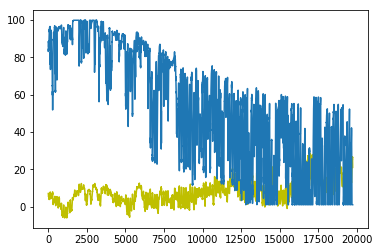

In [70]:
plt.plot(df.T6 , color = 'y')
plt.plot(df.RH_6)
plt.show()


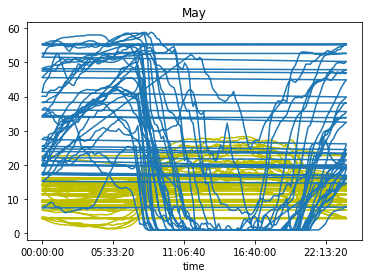

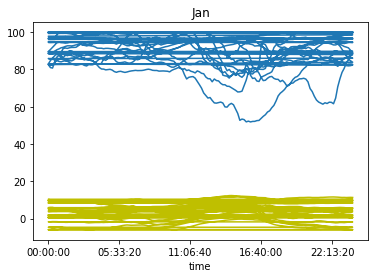

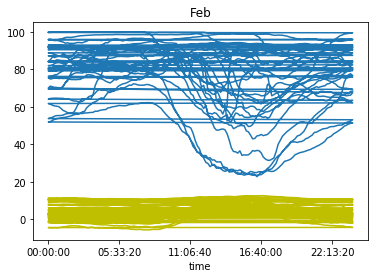

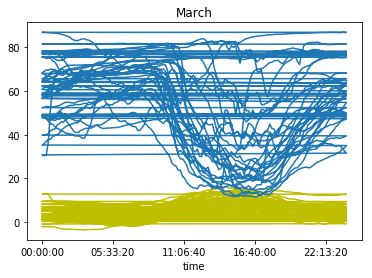

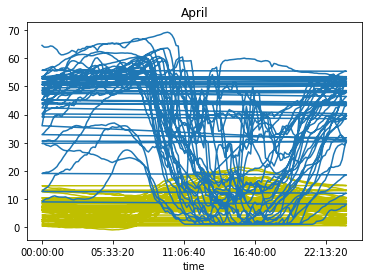

In [21]:
plt.plot(fifth_month.time , fifth_month.T6 ,color = 'y')
plt.plot(fifth_month.time , fifth_month.RH_6)
plt.title('May')
plt.show()

plt.plot(first_month.time , first_month.T6 ,color = 'y')
plt.plot(first_month.time , first_month.RH_6)
plt.title('Jan')
plt.show()

plt.plot(second_month.time , second_month.T6 ,color = 'y')
plt.plot(second_month.time , second_month.RH_6)
plt.title('Feb')
plt.show()

plt.plot(third_month.time , third_month.T6 ,color = 'y')
plt.plot(third_month.time , third_month.RH_6)
plt.title('March')
plt.show()

plt.plot(forth_month.time , forth_month.T6 ,color = 'y')
plt.plot(forth_month.time , forth_month.RH_6)
plt.title('April')
plt.show()

### *When temperature is low , the humidity is very high and as the temperature increases the humidity also decreases.*

### *When the temperature and humidy has high value difference , the graph is far apart but when the va;ues come closer the graph collides like in the case of May and April which says that as temperature increases , there is a high decrease in the humidity unlike the other months.*

#### checking for outliers 

In [71]:
RH_1 = go.Box(x=df.RH_1)
RH_2 = go.Box(x=df.RH_2)
RH_3 = go.Box(x=df.RH_3)
RH_4 = go.Box(x=df.RH_4)
RH_5 = go.Box(x=df.RH_5)
RH_6 = go.Box(x=df.RH_6)
RH_7 = go.Box(x=df.RH_7)
RH_8 = go.Box(x=df.RH_8)
RH_9 = go.Box(x=df.RH_9)
#T_out = go.Box(x=df.T_out)
data = [RH_1,RH_2,RH_3,RH_4,RH_5,RH_6,RH_7,RH_8,RH_9]
py.iplot(data)

### 6.Analysis of Temperature outside (from Chièvres weather station) [ T_out]


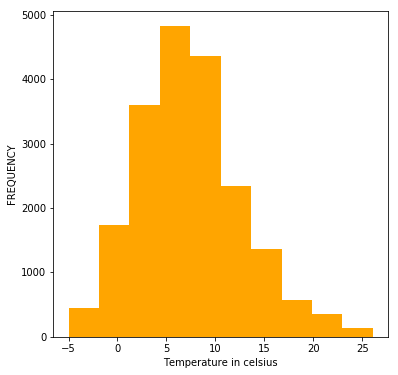

In [10]:
plt.figure(figsize=(6, 6))
plt.hist(df['T_out'] ,color = 'Orange')
plt.xlabel('Temperature in celsius')
plt.ylabel('FREQUENCY')
#plt.title('ANALYSIS OF LIGHT USAGE IN Wh')
plt.show()

### Maximum temperature is between 5 to 10 degree celcius.

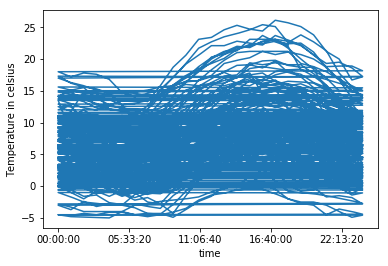

In [11]:
plt.plot(df['time'] , df['T_out'])
plt.xlabel('time')
plt.ylabel('Temperature in celsius')
plt.show()


### *From the above plot , we can see that this has a similar trend like appliances . So there is a possibility for it to be positively related to it.*

In [72]:
# checking for outliers

T1 = go.Box(x=df.T_out)

data = [T1]
py.iplot(data)

### 7. Analysis of pressure (from Chièvres weather station), in mm Hg

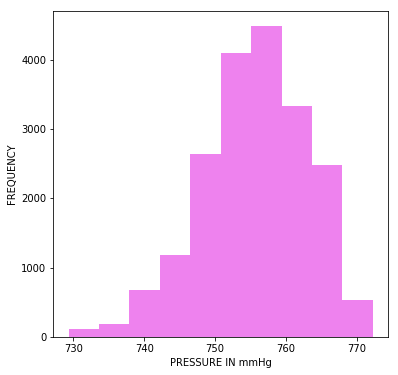

In [12]:
plt.figure(figsize=(6, 6))
plt.hist(df['Press_mm_hg'] ,color = 'violet')
plt.xlabel('PRESSURE IN mmHg')
plt.ylabel('FREQUENCY')
#plt.title('ANALYSIS OF LIGHT USAGE IN Wh')
plt.show()


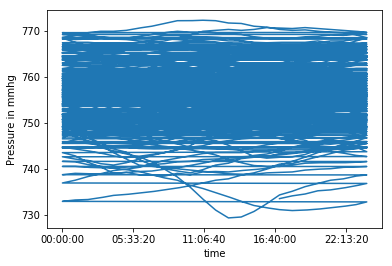

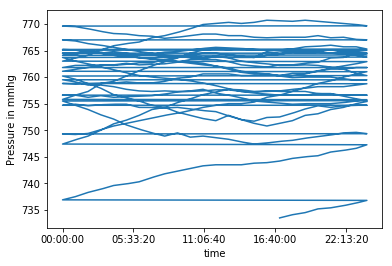

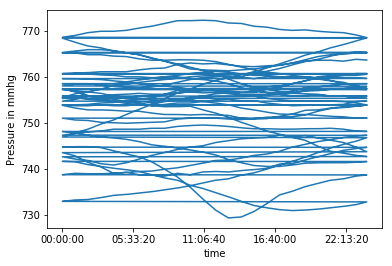

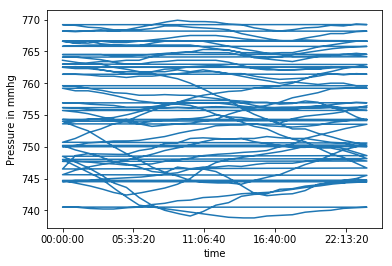

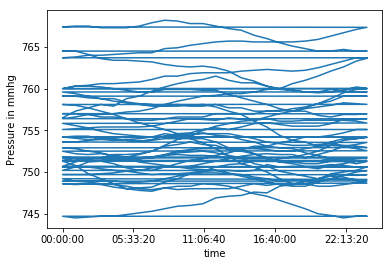

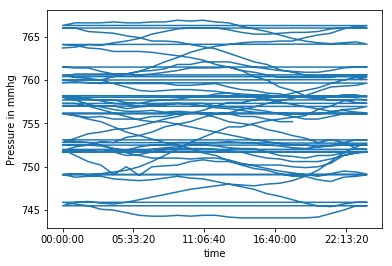

In [13]:
plt.plot(df['time'] , df['Press_mm_hg'])
plt.xlabel('time')
plt.ylabel('Pressure in mmhg')
plt.show()

plt.plot(first_month['time'] , first_month['Press_mm_hg'])
plt.xlabel('time')
plt.ylabel('Pressure in mmhg')
plt.show()

plt.plot(second_month['time'] , second_month['Press_mm_hg'])
plt.xlabel('time')
plt.ylabel('Pressure in mmhg')
plt.show()

plt.plot(third_month['time'] , third_month['Press_mm_hg'])
plt.xlabel('time')
plt.ylabel('Pressure in mmhg')
plt.show()

plt.plot(forth_month['time'] , forth_month['Press_mm_hg'])
plt.xlabel('time')
plt.ylabel('Pressure in mmhg')
plt.show()

plt.plot(fifth_month['time'] , fifth_month['Press_mm_hg'])
plt.xlabel('time')
plt.ylabel('Pressure in mmhg')
plt.show()


### There is no trend shown by this , so there is a chance that it is not correlated to appliances.

In [73]:
#checking for outliers

T1 = go.Box(x=df.Press_mm_hg)

data = [T1]
py.iplot(data)

### 8.RH_out, Humidity outside (from Chièvres weather station), in %

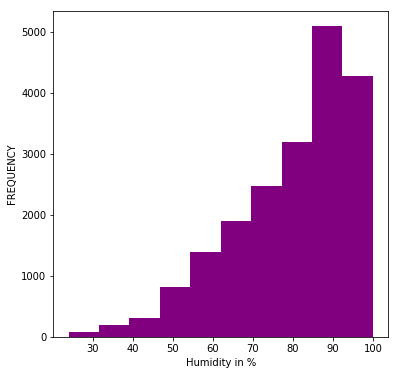

In [14]:
plt.figure(figsize=(6, 6))
plt.hist(df['RH_out'] ,color = 'purple')
plt.xlabel('Humidity in %')
plt.ylabel('FREQUENCY')
#plt.title('ANALYSIS OF LIGHT USAGE IN Wh')
plt.show()

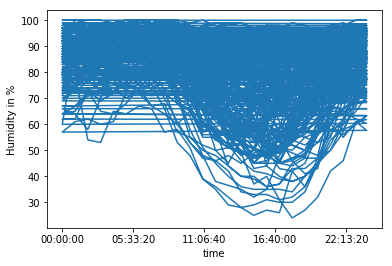

In [15]:
plt.plot(df['time'] , df['RH_out'])
plt.xlabel('time')
plt.ylabel('Humidity in %')
plt.show()

### In T_out , there is a increase in the temperature between 6am to 10pm whereas RH_out decreases during that period.

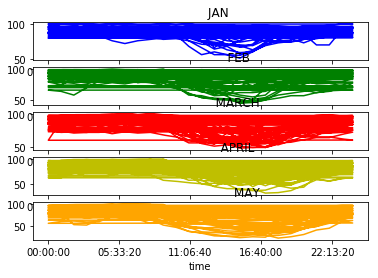

In [48]:
plt.figure(figsize=(1,1))
fig, axarr = plt.subplots(5, 1 )
axarr[0].plot(first_month['time'] , first_month['RH_out'] ,color ='b')# , axarr[0,0])
axarr[0].set_title('         JAN')
axarr[1].plot(second_month['time'] ,second_month['RH_out'] ,color ='g')
axarr[1].set_title('                    FEB')
axarr[2].plot(third_month['time'] , third_month['RH_out'] ,color ='r')
axarr[2].set_title('                   MARCH')
axarr[3].plot(forth_month['time'] , forth_month['RH_out'] ,color ='y')
axarr[3].set_title('                   APRIL')
axarr[4].plot(fifth_month['time'] , fifth_month['RH_out'] ,color ='Orange')
axarr[4].set_title('                        MAY')
#plt.tight_layout #(pad=0.4), w_pad=0.5) , h_pad=10.0)
#plt.xlabel('time')
#plt.ylabel('Humidity in %')
plt.show()

### Every month shows a decrease in RH_out during  that time period , so it is possible that T_out increase during that time and also appliances have maximum energy usage during this time interval.

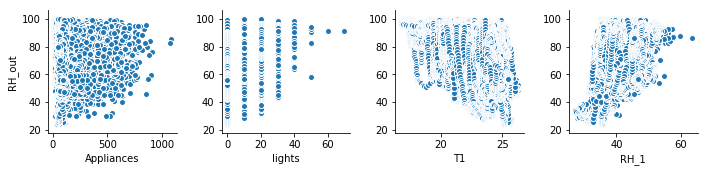

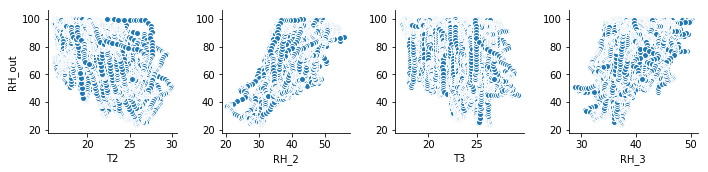

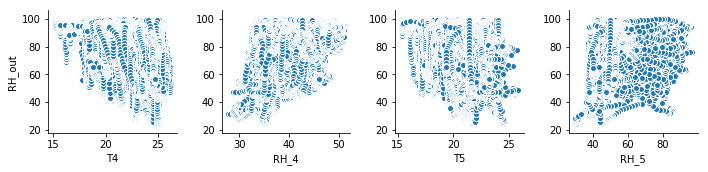

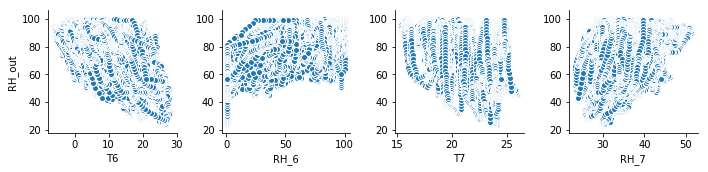

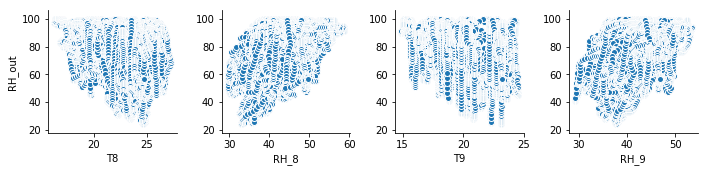

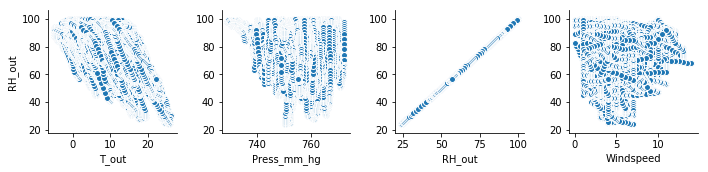

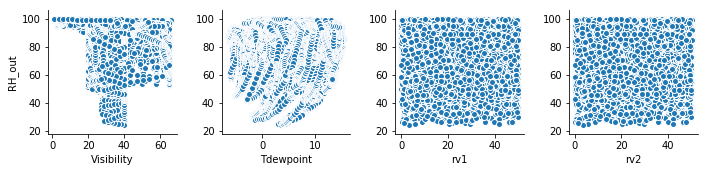

In [49]:
for i in range(0, len(df.columns)-10 , 4):
    sns.pairplot(data=df,
                x_vars=df.columns[i+1:i+5],
                y_vars=["RH_out"])
plt.show()

### From this pairplot , we can say that humiditites are positively correlated to one another and negatively correlated to temperatures.

In [74]:
#checking for outlier

T1 = go.Box(x=df.Tdewpoint)

data = [T1]
py.iplot(data)

### 9.Windspeed (from Chièvres weather station), in m/s

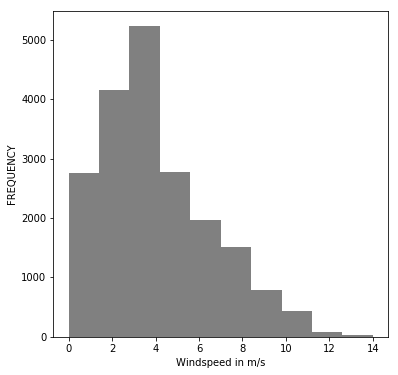

In [16]:
plt.figure(figsize=(6, 6))
plt.hist(df['Windspeed'] ,color = 'grey')
plt.xlabel('Windspeed in m/s')
plt.ylabel('FREQUENCY')
#plt.title('ANALYSIS OF LIGHT USAGE IN Wh')
plt.show()

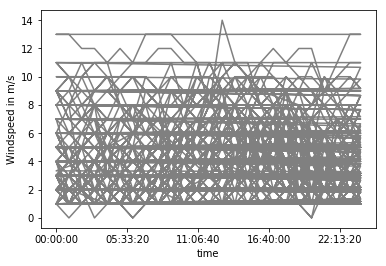

In [17]:
plt.plot(df['time'] , df['Windspeed'] , color='grey')
plt.xlabel('time')
plt.ylabel('Windspeed in m/s')
plt.show()

### No conclusion can be drawn from this as it has no trend which is similar to trend showed by any variable. There is a chance that windspeed along with someother variable influences appliances.

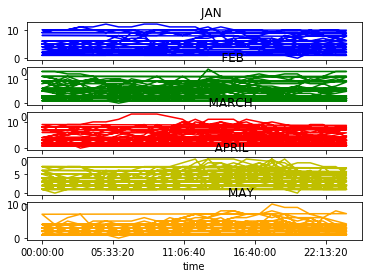

In [32]:
plt.figure(figsize=(1,1))
fig, axarr = plt.subplots(5, 1 )

axarr[0].plot(first_month['time'] , first_month['Windspeed'] ,color ='b')# , axarr[0,0])
axarr[0].set_title('         JAN')
axarr[1].plot(second_month['time'] ,second_month['Windspeed'] ,color ='g')
axarr[1].set_title('                    FEB')
axarr[2].plot(third_month['time'] , third_month['Windspeed'] ,color ='r')
axarr[2].set_title('                   MARCH')
axarr[3].plot(forth_month['time'] , forth_month['Windspeed'] ,color ='y')
axarr[3].set_title('                   APRIL')
axarr[4].plot(fifth_month['time'] , fifth_month['Windspeed'] ,color ='Orange')
axarr[4].set_title('                        MAY')
#plt.tight_layout #(pad=0.4), w_pad=0.5) , h_pad=10.0)
#plt.xlabel('time')
#plt.ylabel('Windspeed in m/s')

plt.show()


### Constant value over time for all the months.

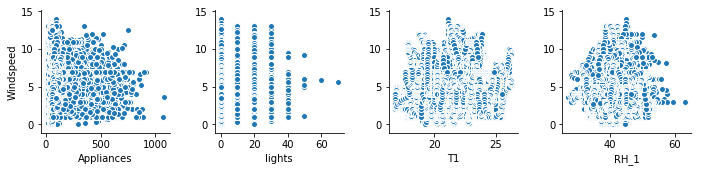

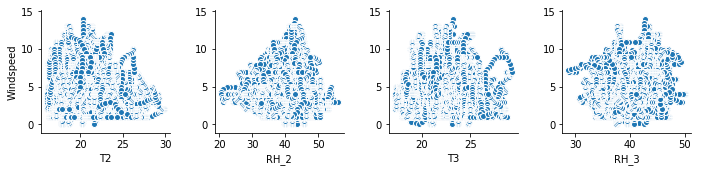

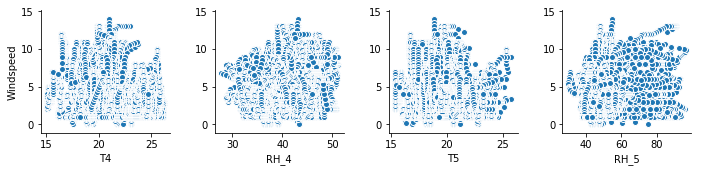

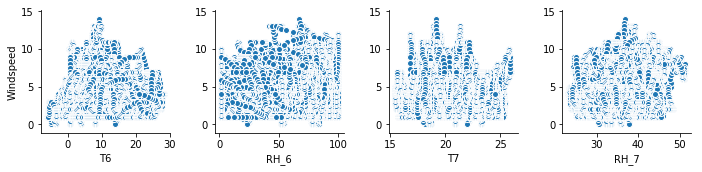

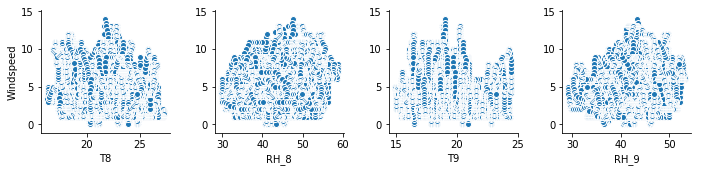

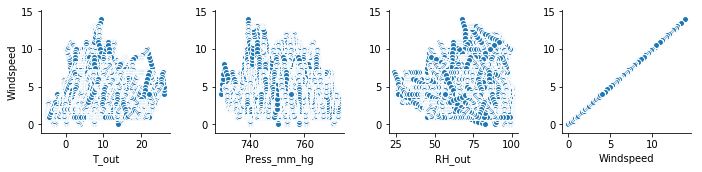

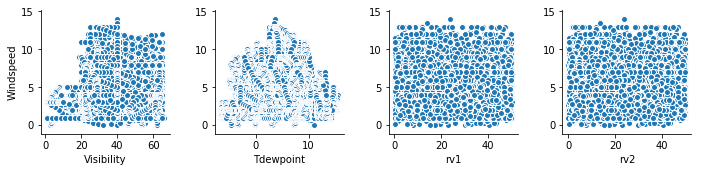

In [55]:
for i in range(0, len(df.columns)-10 , 4):
    sns.pairplot(data=df,
                x_vars=df.columns[i+1:i+5],
                y_vars=["Windspeed"])
plt.show()

In [75]:
#checking for outlier

T1 = go.Box(x=df.Windspeed)

data = [T1]
py.iplot(data)

### 10.Visibility (from Chièvres weather station), in km

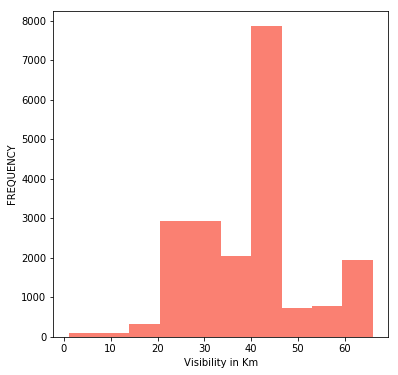

In [18]:
plt.figure(figsize=(6, 6))
plt.hist(df['Visibility'] ,color = 'salmon')
plt.xlabel('Visibility in Km')
plt.ylabel('FREQUENCY')
#plt.title('ANALYSIS OF LIGHT USAGE IN Wh')
plt.show()

### The maximum visibility is 40Km to 47 Km 

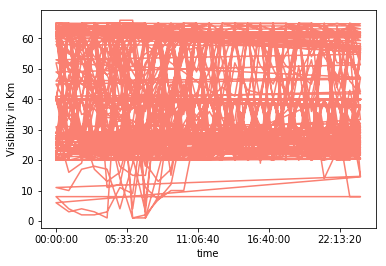

In [19]:
plt.plot(df['time'] , df['Visibility'] ,color = 'salmon')       
plt.xlabel('time')
plt.ylabel('Visibility in Km')
plt.show()

### * There is a constant trend in the visibility overall , but between 12 midnight to 5:30 am there is a decrease in few datapoint*

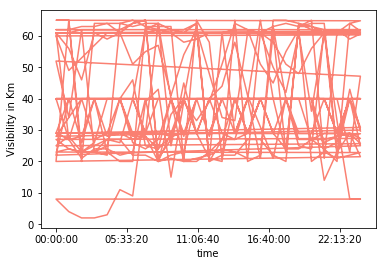

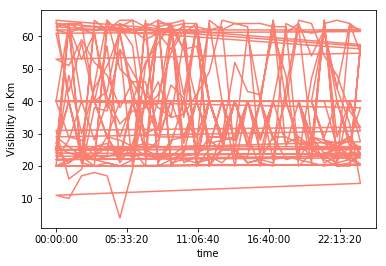

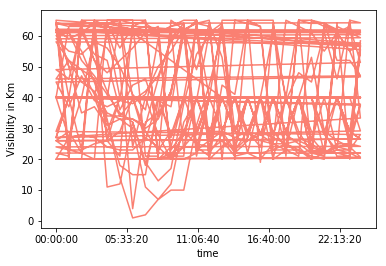

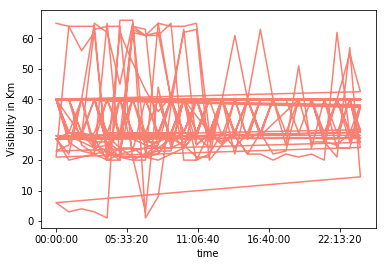

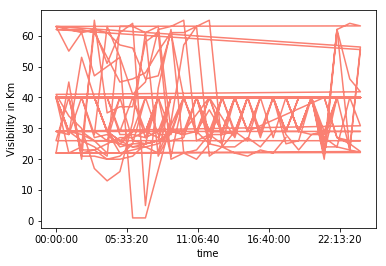

In [20]:
plt.plot(first_month['time'] , first_month['Visibility'] ,color = 'salmon')       
plt.xlabel('time')
plt.ylabel('Visibility in Km')
plt.show()

plt.plot(second_month['time'] , second_month['Visibility'] ,color = 'salmon')       
plt.xlabel('time')
plt.ylabel('Visibility in Km')
plt.show()

plt.plot(third_month['time'] , third_month['Visibility'] ,color = 'salmon')       
plt.xlabel('time')
plt.ylabel('Visibility in Km')
plt.show()

plt.plot(forth_month['time'] , forth_month['Visibility'] ,color = 'salmon')       
plt.xlabel('time')
plt.ylabel('Visibility in Km')
plt.show()

plt.plot(fifth_month['time'] , fifth_month['Visibility'] ,color = 'salmon')       
plt.xlabel('time')
plt.ylabel('Visibility in Km')
plt.show()

### *From all the above plots , we can see that there is a decrease in the visibility between 12 pm midnight to 5:30 am*

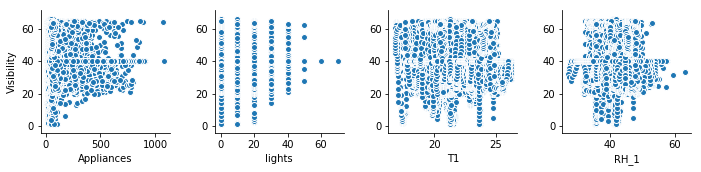

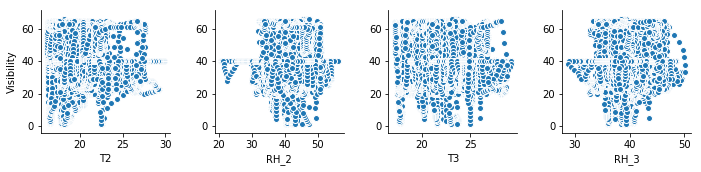

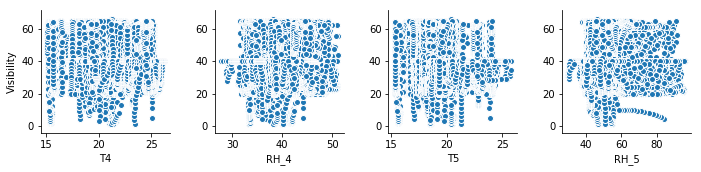

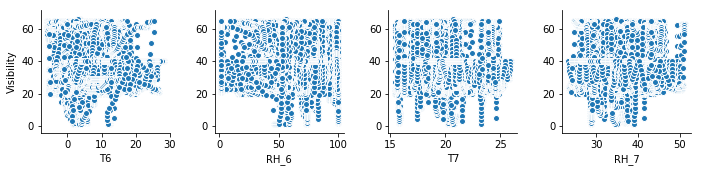

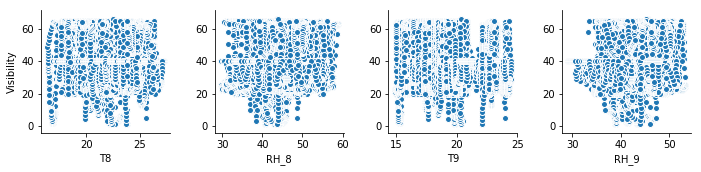

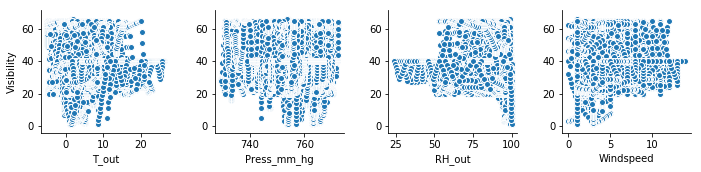

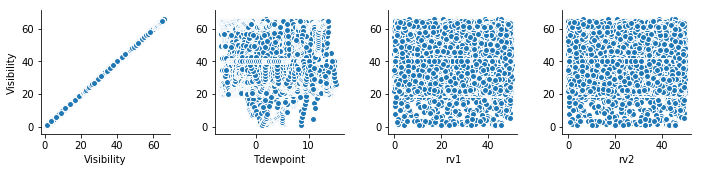

In [9]:
for i in range(0, len(df.columns)-10 , 4):
    sns.pairplot(data=df,
                x_vars=df.columns[i+1:i+5],
                y_vars=["Visibility"])
plt.show()

### *From the above plots , visibility doesn't seem to have any positive or negative correlation with any other variables except humidity and temperature*

In [76]:
#checking for outliers

T1 = go.Box(x=df.Visibility)

data = [T1]
py.iplot(data)

### 11.Tdewpoint (from Chièvres weather station), °C


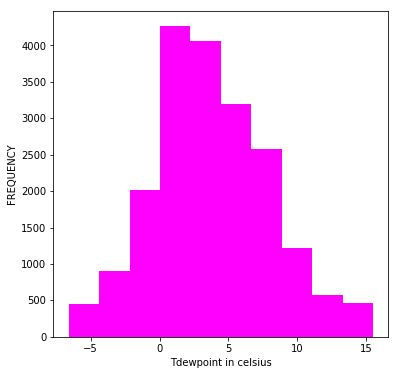

In [10]:
plt.figure(figsize=(6, 6))
plt.hist(df['Tdewpoint'] ,color = 'magenta')
plt.xlabel('Tdewpoint in celsius')
plt.ylabel('FREQUENCY')
#plt.title('ANALYSIS OF LIGHT USAGE IN Wh')
plt.show()

### *Dew point is mostly positive and the maximum observation is made between 0 degrees to 5 degrees*

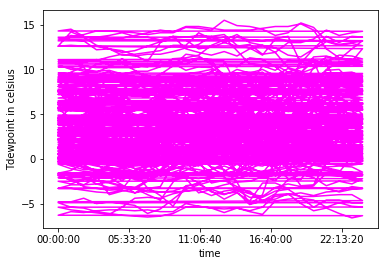

In [11]:
plt.plot(df['time'] , df['Tdewpoint'] ,color = 'magenta' )
plt.xlabel('time')
plt.ylabel('Tdewpoint in celsius')
plt.show()

### *Looks like dewpoint doesn't change with time which implies that its effect on appliances energy should be less*

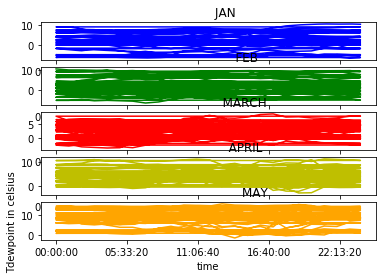

In [12]:
plt.figure(figsize=(1,1))
fig, axarr = plt.subplots(5, 1 )
axarr[0].plot(first_month['time'] , first_month['Tdewpoint'] ,color ='b')# , axarr[0,0])
axarr[0].set_title('         JAN')
axarr[1].plot(second_month['time'] ,second_month['Tdewpoint'] ,color ='g')
axarr[1].set_title('                    FEB')
axarr[2].plot(third_month['time'] , third_month['Tdewpoint'] ,color ='r')
axarr[2].set_title('                   MARCH')
axarr[3].plot(forth_month['time'] , forth_month['Tdewpoint'] ,color ='y')
axarr[3].set_title('                   APRIL')
axarr[4].plot(fifth_month['time'] , fifth_month['Tdewpoint'] ,color ='Orange')
axarr[4].set_title('                        MAY')
#plt.tight_layout #(pad=0.4), w_pad=0.5) , h_pad=10.0)
plt.xlabel('time')
plt.ylabel('Tdewpoint in celsius')
plt.show()


### * The behaviour of the plot is same for all the months*

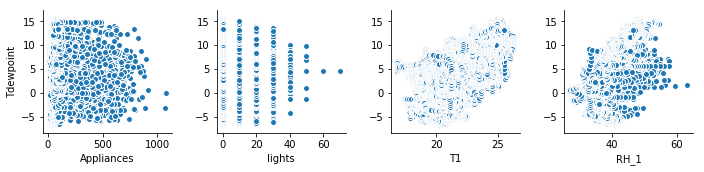

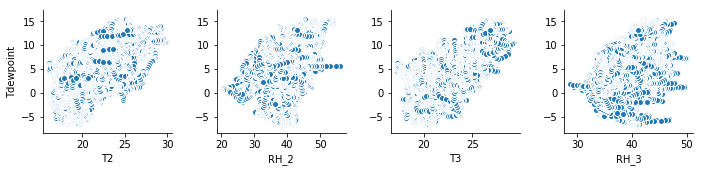

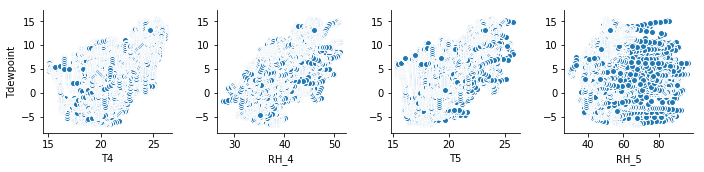

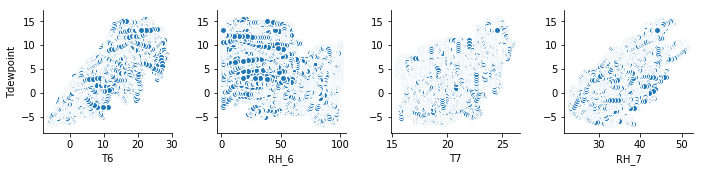

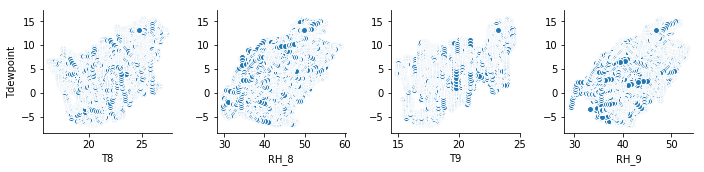

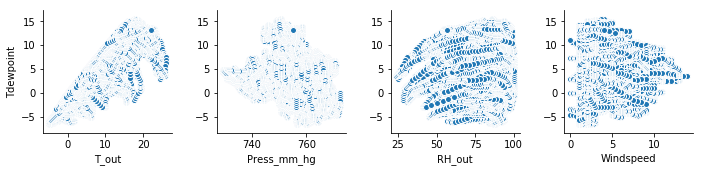

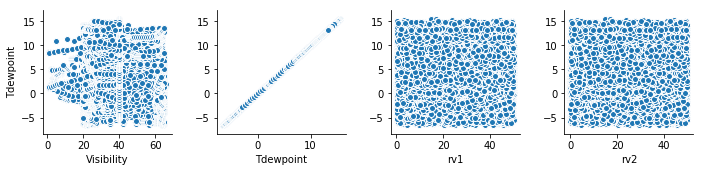

In [14]:
for i in range(0, len(df.columns)-10 , 4):
    sns.pairplot(data=df,
                x_vars=df.columns[i+1:i+5],
                y_vars=["Tdewpoint"])
plt.show()


### * 1. All the temperatures are linear to dewpoint.*
### * 2. Interesting point is , some humidity variables are linear to dewpoint whereas some are non-linear.*

In [77]:
#checking for outliers

T1 = go.Box(x=df.Tdewpoint)

data = [T1]
py.iplot(data)

### 12.Analysing with respect to date column

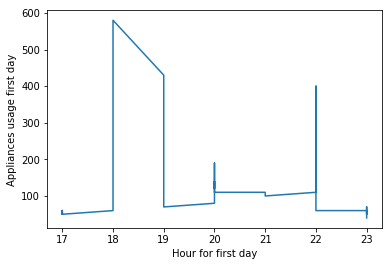

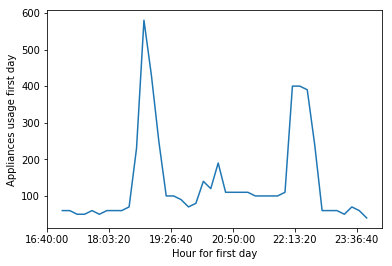

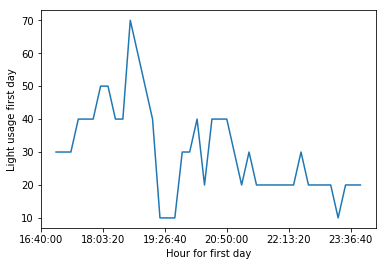

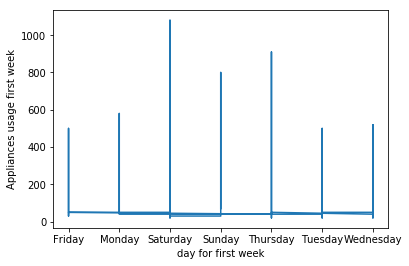

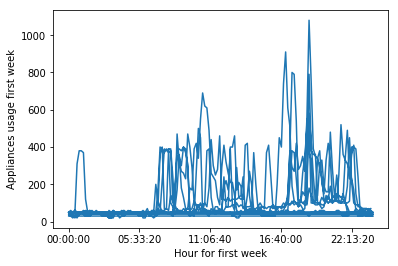

In [42]:
plt.plot(df.hour[0:42] , df.Appliances[0:42])
plt.xlabel('Hour for first day')
plt.ylabel('Appliances usage first day')
plt.show() # first day

data = [
    go.Bar(
        x=df.hour[0:42], # assign x as the dataframe column 'x'
        y=df.Appliances[0:42]
    )
]
py.iplot(data, filename='pandas-bar-chart')


plt.plot(df.time[0:42] , df.Appliances[0:42])
plt.xlabel('Hour for first day')
plt.ylabel('Appliances usage first day')
plt.show()

plt.plot(df.time[0:42] , df.lights[0:42])  #first day
plt.xlabel('Hour for first day')
plt.ylabel('Light usage first day')
plt.show()

plt.plot(df.day_of_week[0:905] , df.Appliances[0:905])
plt.xlabel('day for first week')
plt.ylabel('Appliances usage first week')
plt.show()

plt.plot(df.time[0:905] , df.Appliances[0:905])
plt.xlabel('Hour for first week')
plt.ylabel('Appliances usage first week')
plt.show()

#### * 1. For the first week ,ther overall usage of appliances if high between 6 to 7 in the evening and at night . In the third graph we can see that there is a hike in the usage of lights between the same time.*
#### * 2. Saturday and Thursday has used maximum in the first week* 

### *Above graph is not very effective in analysing the dataset*

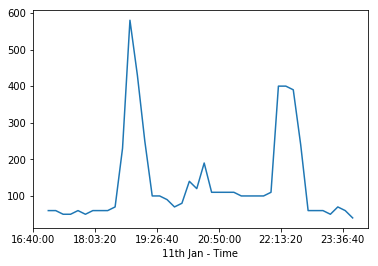

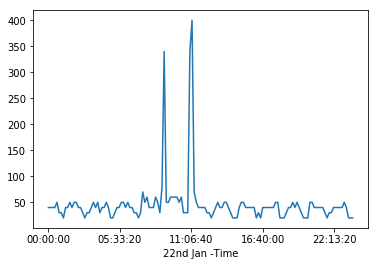

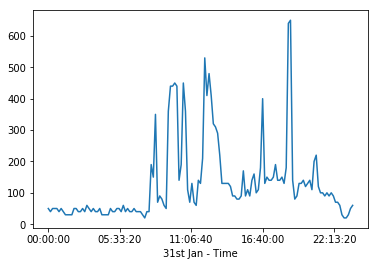

In [22]:
plt.plot(df.time[0:42] , df.Appliances[0:42])
plt.xlabel('11th Jan - Time')
plt.show()
plt.plot(df.time[1482:1625] ,df.Appliances[1482:1625])
plt.xlabel('22nd Jan -Time')
plt.show()
plt.plot(df.time[2778:2921] , df.Appliances[2778:2921])
plt.xlabel('31st Jan - Time')
plt.show()

#### * The above graph is plotted for each week for month of Jan. What we can observe is that , there is no regular patter for the usage of appliances. It is random , but when we plotted the graph for all the months with appliances , we could see a peak between 7:00 pm to  7:30 pm which means overall the appliances usage has been maximum within that time interval.*

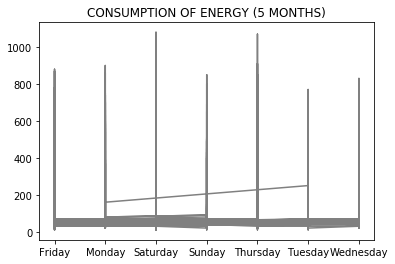

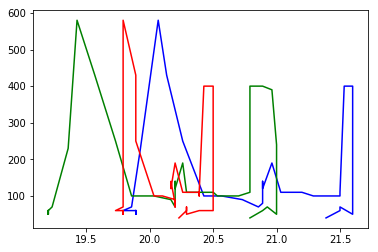

In [38]:
plt.plot(df.day_of_week , df.Appliances ,color = 'grey')
plt.title('CONSUMPTION OF ENERGY (5 MONTHS)')
plt.show()

plt.plot(df.T1[0:42] , df.Appliances[0:42] ,color = 'b')
plt.plot(df.T2[0:42] , df.Appliances[0:42] , color = 'g' )
plt.plot(df.T3[0:42] , df.Appliances[0:42] , color = 'r' )
plt.show()

### 1. The first graph tells us that Saturday and Thursday has used the maximum of the appliances energy but again it could be due to the outliers too.

### 2.  The second graph is between T1, T2,T3 and appliances. So when the temperature is low , the appliances have been used maximum and as temperature increases , the appliances useage has drastically decreased.


In [78]:
#plt.plot(df.Windspeed[0:42] , df.Appliances[0:42]  ,label = 'Windspeed') # with increase in windspeed the temperature decreases which has resulted
#plt.plot(df.T_out[0:42] , df.Appliances[0:42] , color = 'g')  # in the increase of appliances, Similarly , if windspeed and temp increases
#plt.plot(df.RH_out[0:42] , df.Appliances[0:42]  ,label = 'RH_out')      # together , the appliances also increases but by a very small amount.
#plt.plot(df.Tdewpoint[0:42] , df.Appliances[0:42] , color = 'Orange')
#plt.xlabel('Windspeed')
#plt.ylabel('Appliances')
#plt.show()


#plt.plot(df.time[0:42] ,df.Windspeed[0:42] , color ='b')
#plt.plot(df.time[0:42] ,df.T_out[0:42] , color = 'g')
#plt.plot(df.time[0:42] ,df.RH_out[0:42] , color = 'r')
#plt.plot(df.time[0:42] ,df.Tdewpoint[0:42] ,color = 'Orange')
#plt.plot(df.T6[0:42] , df.Appliances[0:42] , color = 'r')
#plt.plot(df.time[0:42] , df.Appliances[0:42] ,color = 'r')
#plt.show()

#plt.plot(df.time[0:42] , df.Appliances[0:42] ,color = 'r')
#plt.show()

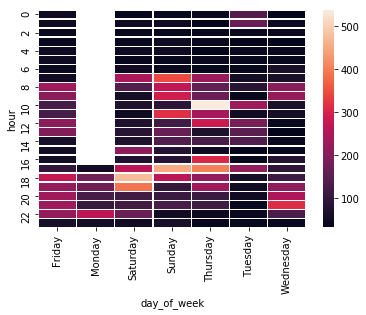

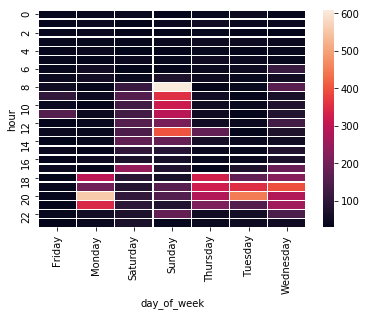

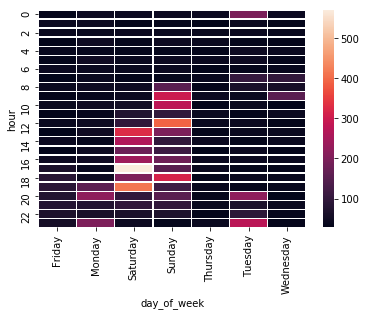

In [62]:
df_1 = df[['hour' , 'day_of_week' ,'Appliances']]
df_2 = df_1.iloc[0:905]
df_3 = df_1.iloc[906:1913]
df_4 = df_1.iloc[1914:2921]

pivoted = df_2.pivot_table(index='hour',columns= 'day_of_week',values='Appliances')
pivoted_2 = df_3.pivot_table(index='hour',columns= 'day_of_week',values='Appliances')
pivoted_3 = df_4.pivot_table(index='hour',columns= 'day_of_week',values='Appliances')
#flights = df_2[("hour", "day_of_week", "Appliances")]
#flights = flights.reindex(df.iloc[:23].hour)

#columns = [0,905]
#myflights = flights.copy()
#mask = myflights.columns.isin(columns)
#myflights.loc[:, ~mask] = 0
#arr = flights.values
#vmin, vmax = arr.min(), arr.max()

sns.heatmap(pivoted ,linewidths = 0.3 ) #, vmin=vmin, vmax=vmax)
plt.show()

sns.heatmap(pivoted_2 ,linewidths = 0.3 ) #, vmin=vmin, vmax=vmax)
plt.show()

sns.heatmap(pivoted_3 ,linewidths = 0.3 ) #, vmin=vmin, vmax=vmax)
plt.show()


### The above plotted heatmap gives us basic idea about how much energy is used per week in the month of January.

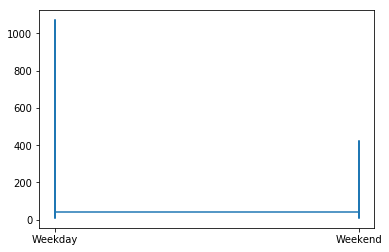

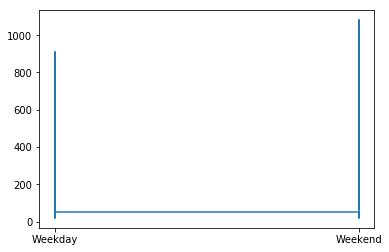

In [69]:
plt.plot(first_month.WeekStatus[906:1812 ] , first_month.Appliances[906:1812 ])
plt.show()
#2715:4525  0:905  906:1812 1813:2719 2720:3626
plt.plot(first_month.WeekStatus[0:905] , first_month.Appliances[0:905 ])
plt.show()

### The above graph tells us that irrespective of the day of the week ,the appliances energy is being used.

### Overall Correlation

In [64]:
df.corr()

,Appliances,lights,T1,RH_1,T2,RH_2,T3,RH_3,T4,RH_4,...,RH_out,Windspeed,Visibility,Tdewpoint,rv1,rv2,hour,day,Numerical_Week,weekStatus
Appliances,1.000000,0.197278,0.055447,0.086031,0.120073,-0.060465,0.085060,0.036292,0.040281,0.016965,...,-0.152282,0.087122,0.000230,0.015353,-0.011145,-0.011145,0.216792,0.002366,0.003060,0.003060
lights,0.197278,1.000000,-0.023528,0.106968,-0.005622,0.050985,-0.097393,0.131161,-0.008859,0.114936,...,0.068543,0.060281,0.020038,-0.036322,0.000521,0.000521,0.255346,-0.041895,-0.099828,-0.099828
T1,0.055447,-0.023528,1.000000,0.164006,0.836834,-0.002509,0.892402,-0.028550,0.877001,0.097861,...,-0.345481,-0.087654,-0.076210,0.571309,-0.006203,-0.006203,0.178858,-0.127088,0.001381,0.001381
RH_1,0.086031,0.106968,0.164006,1.000000,0.269839,0.797535,0.253230,0.844677,0.106180,0.880359,...,0.274126,0.204932,-0.021057,0.639106,-0.000699,-0.000699,0.018594,-0.041397,-0.053782,-0.053782
T2,0.120073,-0.005622,0.836834,0.269839,1.000000,-0.165610,0.735245,0.121497,0.762066,0.231563,...,-0.505291,0.052495,-0.069721,0.582602,-0.011087,-0.011087,0.254784,-0.156913,0.000602,0.000602
RH_2,-0.060465,0.050985,-0.002509,0.797535,-0.165610,1.000000,0.137319,0.678326,-0.047304,0.721435,...,0.584911,0.069190,-0.005368,0.499152,0.006275,0.006275,-0.183322,0.037117,-0.044249,-0.044249
T3,0.085060,-0.097393,0.892402,0.253230,0.735245,0.137319,1.000000,-0.011234,0.852778,0.122737,...,-0.281718,-0.100776,-0.102310,0.645886,-0.005194,-0.005194,0.037624,-0.077190,-0.017514,-0.017514
RH_3,0.036292,0.131161,-0.028550,0.844677,0.121497,0.678326,-0.011234,1.000000,-0.140457,0.898978,...,0.356192,0.263188,0.017041,0.414387,-0.000477,-0.000477,-0.052392,-0.048427,-0.035182,-0.035182
T4,0.040281,-0.008859,0.877001,0.106180,0.762066,-0.047304,0.852778,-0.140457,1.000000,-0.048650,...,-0.388602,-0.185747,-0.104768,0.519471,-0.001815,-0.001815,0.088407,-0.121867,-0.091006,-0.091006
RH_4,0.016965,0.114936,0.097861,0.880359,0.231563,0.721435,0.122737,0.898978,-0.048650,1.000000,...,0.336813,0.300192,0.002636,0.616509,-0.001787,-0.001787,-0.019068,-0.005404,-0.005749,-0.005749


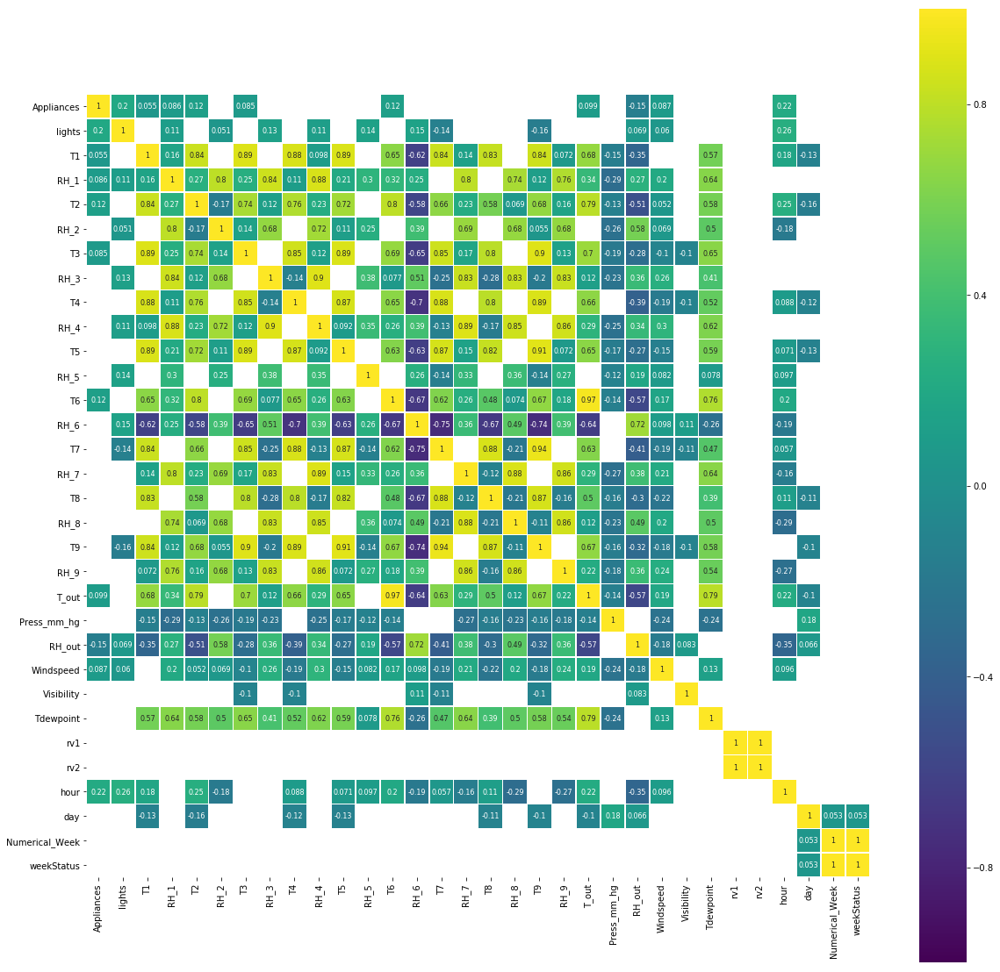

In [65]:
corr = df.drop('date', axis=1).corr() 
plt.figure(figsize=(20, 20))

sns.heatmap(corr[(corr >= 0.05) | (corr <= -0.1)], 
            cmap='viridis', vmax=1.0, vmin=-1.0, linewidths=0.5,
            annot=True, annot_kws={"size": 8}, square=True)
plt.show()

### This is a heatmap which shows how parameters are related to one another.
### I have taken any correlation factor >0.05 as valid ones.

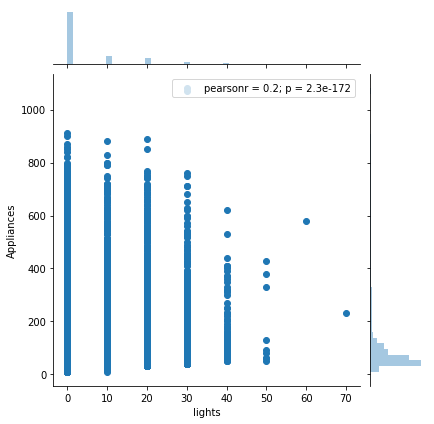

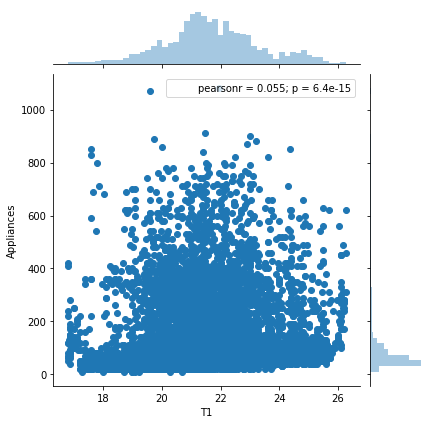

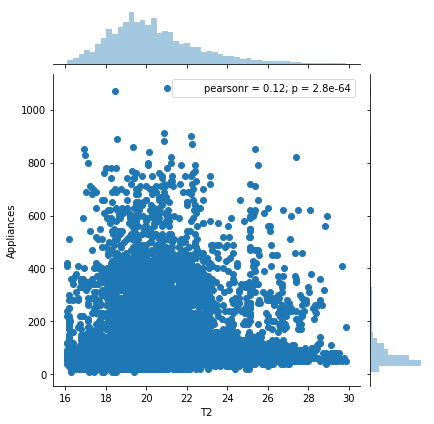

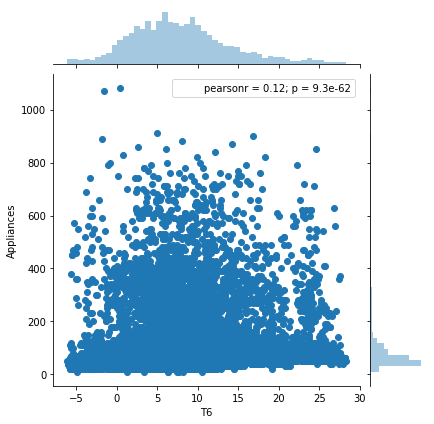

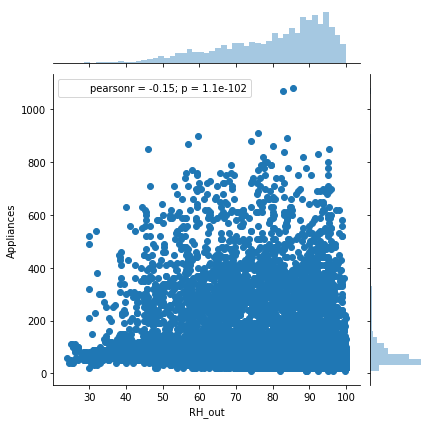

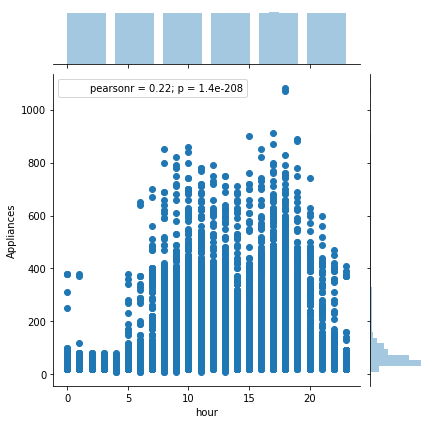

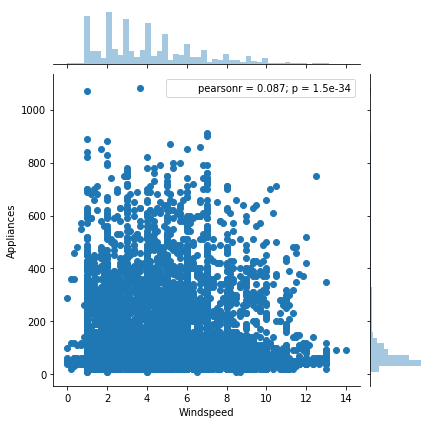

In [49]:
sns.jointplot(x = df.lights , y =df.Appliances)
plt.show()
sns.jointplot(x = df.T1, y =df.Appliances)
plt.show()

sns.jointplot(x = df.T2 , y =df.Appliances)
plt.show()

sns.jointplot(x = df.T6 , y =df.Appliances)
plt.show()

sns.jointplot(x = df.RH_out , y =df.Appliances)
plt.show()

sns.jointplot(x = df.hour , y =df.Appliances)
plt.show()

sns.jointplot(x =df.Windspeed ,y = df.Appliances)
plt.show()

### The above plots are plotted for variables which proved to have a good correlation with appliances.

In [44]:
#plt.plot(df.T6[0:42] , df.Appliances[0:42] , color = 'y')
#plt.ylabel('APPLIANCES')
#plt.xlabel('T6')
#plt.show()
#plt.plot(df.Windspeed[0:42] , df.Appliances[0:42] , color = 'g')
#plt.ylabel('Appliances')
#plt.xlabel('Widspeed')
#plt.show()
#plt.plot( df.time[0:42] , df.Windspeed[0:42] ,color = 'r')
#plt.xlabel('time')
#plt.ylabel('windspeed')
#plt.show()
#plt.plot(df.time[0:42] ,df.T6[0:42]   , color = 'Orange')
#plt.xlabel('time')
#plt.ylabel('T6')
#plt.show()
#plt.plot(df.time[0:42],df.Appliances[0:42])
#plt.show()

In [79]:

trace = go.Heatmap(z= df.Appliances,
                   x= df.day_of_week,
                   y= df.hour)
data=[trace]
py.iplot(data, filename='labelled-heatmap')

### This gives us information about which day at what time has consumed how much energy.